# Intro
Simple Program to load and check the 4STAR archive files.

For R3 of ORACLES 2016, AOD

# Load the defaults and imports

In [1]:
%config InlineBackend.rc = {}
import matplotlib 
import os
matplotlib.rc_file(os.path.join(os.getcwd(),'file.rc'))
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
import Sp_parameters as Sp
from load_utils import mat2py_time, toutc, load_ict
from Sp_parameters import smooth
from linfit import linfit
from path_utils import getpath
from plotting_utils import make_boxplot

In [2]:
%matplotlib notebook

In [3]:
fp =getpath('NAAMES')#'C:/Userds/sleblan2/Research/ORACLES/'
fp

u'/mnt/c/Users/sleblanc/Research/NAAMES/'

# load the files

In [44]:
days = ['20170916','20170917','20170919','20170920']

In [48]:
days = ['20170831','20170904','20170906','20170908','20170909','20170912','20170916','20170917','20170919','20170920']

In [5]:
vv = 'R1'

In [6]:
vi = 'v2'

In [49]:
outaod_RA = []
outaod_head_RA = []
outgas_RA = []
outgas_head_RA = []
for i,d in enumerate(days):
    try:
        print 'Doing day: {}'.format(d)
        fname_aod = fp+'NAAMES3_aod_ict/{vi}/NAAMES-4STARB-AOD_C130_{}_{vv}.ict'.format(d,vv=vv,vi=vi)
        tt,th = load_ict(fname_aod,return_header=True)
    except:
        print '*** Problem with day: {} *** Skipping '.format(d)
        days.pop(i)
        continue
    
    outaod_RA.append(tt)
    outaod_head_RA.append(th)
    
    #fname_gas = fp+'gas_ict/korusaq-4STAR-GASES_DC8_{}_RA.ict'.format(d)
    #ttr,thr = load_ict(fname_gas,return_header=True)
    #outgas_RA.append(ttr)
    #outgas_head_RA.append(thr)

Doing day: 20170831
('Start_UTC', 'Latitude', 'Longitude', 'GPS_Alt', 'qual_flag', 'cirrus_flag', 'amass_aer', 'AOD_angstrom_470_865', 'AOD0355', 'AOD0380', 'AOD0452', 'AOD0470', 'AOD0501', 'AOD0520', 'AOD0530', 'AOD0532', 'AOD0550', 'AOD0606', 'AOD0620', 'AOD0660', 'AOD0675', 'AOD0781', 'AOD0865', 'AOD1020', 'AOD1040', 'AOD1064', 'AOD1236', 'AOD1250', 'UNCAOD0355', 'UNCAOD0380', 'UNCAOD0452', 'UNCAOD0470', 'UNCAOD0501', 'UNCAOD0520', 'UNCAOD0530', 'UNCAOD0532', 'UNCAOD0550', 'UNCAOD0606', 'UNCAOD0620', 'UNCAOD0660', 'UNCAOD0675', 'UNCAOD0781', 'UNCAOD0865', 'UNCAOD1020', 'UNCAOD1040', 'UNCAOD1064', 'UNCAOD1236', 'UNCAOD1250')
Doing day: 20170904
('Start_UTC', 'Latitude', 'Longitude', 'GPS_Alt', 'qual_flag', 'cirrus_flag', 'amass_aer', 'AOD_angstrom_470_865', 'AOD0355', 'AOD0380', 'AOD0452', 'AOD0470', 'AOD0501', 'AOD0520', 'AOD0530', 'AOD0532', 'AOD0550', 'AOD0606', 'AOD0620', 'AOD0660', 'AOD0675', 'AOD0781', 'AOD0865', 'AOD1020', 'AOD1040', 'AOD1064', 'AOD1236', 'AOD1250', 'UNCAOD035

In [8]:
len(outaod_RA)

10

In [9]:
len(days)

10

In [10]:
outaod_head_RA[0]

['82, 1001\n',
 'Jens Redemann\n',
 'NASA Ames Research Center\n',
 'Spectrometers for Sky-Scanning, Sun-Tracking Atmospheric Research - B (4STARB)\n',
 'NAAMES-3 (2017)\n',
 '1, 1\n',
 '2017, 08, 31, 2018, 11, 12\n',
 '1\n',
 'Start_UTC, seconds, Elapsed seconds from 0 hours UT on day: 20170831\n',
 '47\n',
 '1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1\n',
 ' -9999.0000000, -9999.0000000, -9999.0, -9999, -9999, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000, -9999.000\n',
 'Latitude, deg, Aircra

## Check the variables in header

In [11]:
nm = outaod_RA[0].dtype.names

In [167]:
nm

('Start_UTC',
 'Latitude',
 'Longitude',
 'GPS_Alt',
 'qual_flag',
 'cirrus_flag',
 'amass_aer',
 'AOD_angstrom_470_865',
 'AOD0355',
 'AOD0380',
 'AOD0452',
 'AOD0470',
 'AOD0501',
 'AOD0520',
 'AOD0530',
 'AOD0532',
 'AOD0550',
 'AOD0606',
 'AOD0620',
 'AOD0660',
 'AOD0675',
 'AOD0781',
 'AOD0865',
 'AOD1020',
 'AOD1040',
 'AOD1064',
 'AOD1236',
 'AOD1250',
 'UNCAOD0355',
 'UNCAOD0380',
 'UNCAOD0452',
 'UNCAOD0470',
 'UNCAOD0501',
 'UNCAOD0520',
 'UNCAOD0530',
 'UNCAOD0532',
 'UNCAOD0550',
 'UNCAOD0606',
 'UNCAOD0620',
 'UNCAOD0660',
 'UNCAOD0675',
 'UNCAOD0781',
 'UNCAOD0865',
 'UNCAOD1020',
 'UNCAOD1040',
 'UNCAOD1064',
 'UNCAOD1236',
 'UNCAOD1250')

In [12]:
wl = nm[8:-1]
wl = wl[0:20]

In [13]:
for a in wl:
    print a

AOD0355
AOD0380
AOD0452
AOD0470
AOD0501
AOD0520
AOD0530
AOD0532
AOD0550
AOD0606
AOD0620
AOD0660
AOD0675
AOD0781
AOD0865
AOD1020
AOD1040
AOD1064
AOD1236
AOD1250


# Plot the files

In [53]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(2,sharex=True,figsize=(9,5))
    ax = ax.ravel()
    ax[0].set_title('AOD {} saved file for flight {}'.format(vv,d))
    ax[0].set_color_cycle([plt.cm.gist_ncar(k) for k in np.linspace(0, 1, len(wl)+1)])
    for aod in wl:
        ax[0].plot(outaod_RA[i][nm[0]],outaod_RA[i][aod],'.',label=aod)
    try:
        for x in outaod_RA[i][nm[0]][np.where(outaod_RA[i]['qual_flag']==1)[0]]:
            ax[0].axvline(x,color='#DDDDDD',alpha=0.02)
    except:
        pass
    ax[0].set_ylabel('AOD')
    ax[0].set_ylim(0,1)
    ax[0].axhline(0,color='k')
    box = ax[0].get_position()
    ax[0].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[0].legend(frameon=False,loc='center left',bbox_to_anchor=(1.1,-0.2),numpoints=1,ncol=2)
    ax[1].plot(outaod_RA[i][nm[0]],outaod_RA[i]['GPS_Alt'],'.')
    ax[1].set_ylabel('Alt [m]')
    axy = ax[1].twinx()
    axy.plot(outaod_RA[i][nm[0]],outaod_RA[i]['amass_aer'],'.g')
    axy.set_ylabel('Airmass factor',color='g')
    box = ax[1].get_position()
    ax[1].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    box = axy.get_position()
    axy.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[1].set_xlabel('UTC [h]')
    plt.savefig(fp+'NAAMES3_aod_ict/{vi}/{vv}/{vv}_{}.png'.format(d,vv=vv,vi=vi),dpi=600,transparent=True)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

RuntimeError: LaTeX was not able to process the following string:
'AOD R1 saved file for flight 20170909'
Here is the full report generated by LaTeX: 

No latex error report available.

In [56]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(2,sharex=True,figsize=(9,5))
    ax = ax.ravel()
    ax[0].set_title('4STARB AOD {} for flight {}'.format(vv,d))
    ax[0].set_color_cycle([plt.cm.gist_ncar(k) for k in np.linspace(0, 1, len(wl)+1)])
    for aod in wl:
        ii = np.where((outaod_RA[i]['qual_flag']==0))[0]
        ax[0].plot(outaod_RA[i][nm[0]][ii],outaod_RA[i][aod][ii],'.',label=aod)
    ax[0].set_ylabel('AOD')
    ax[0].set_ylim(-0.01,0.2)
    ax[0].axhline(0,color='k')
    box = ax[0].get_position()
    ax[0].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[0].legend(frameon=False,loc='center left',bbox_to_anchor=(1.1,-0.2),numpoints=1,ncol=2)
    ax[1].plot(outaod_RA[i][nm[0]],outaod_RA[i]['GPS_Alt'],'.')
    ax[1].set_ylabel('Alt [m]')
    axy = ax[1].twinx()
    axy.plot(outaod_RA[i][nm[0]],outaod_RA[i]['amass_aer'],'.g')
    axy.set_ylabel('Airmass factor',color='g')
    box = ax[1].get_position()
    ax[1].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    box = axy.get_position()
    axy.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[1].set_xlabel('UTC [h]')
    plt.savefig(fp+'NAAMES3_aod_ict/{vi}/{vv}/{vv}_4STARB_QA_AOD_{}.png'.format(d,vv=vv,vi=vi),dpi=600,transparent=True)

<IPython.core.display.Javascript object>

RuntimeError: LaTeX was not able to process the following string:
'4STARB AOD R1 for flight 20170831'
Here is the full report generated by LaTeX: 

No latex error report available.

## Plot the high altitude subset of the data for calibration

<IPython.core.display.Javascript object>


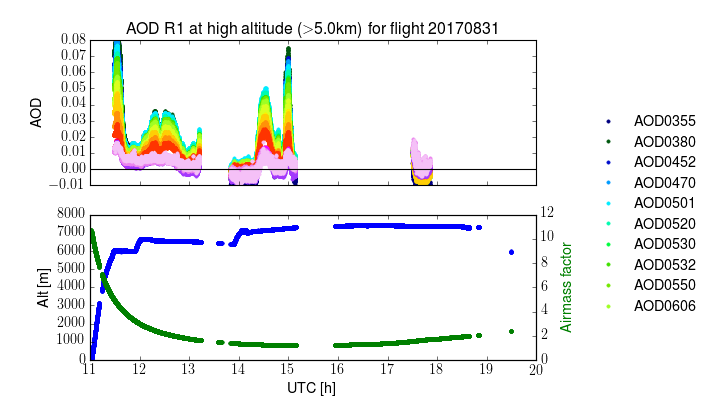

/usr/lib/python2.7/dist-packages/matplotlib/cbook.py:137: MatplotlibDeprecationWarning: The set_color_cycle attribute was deprecated in version 1.5. Use set_prop_cycle instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


<IPython.core.display.Javascript object>


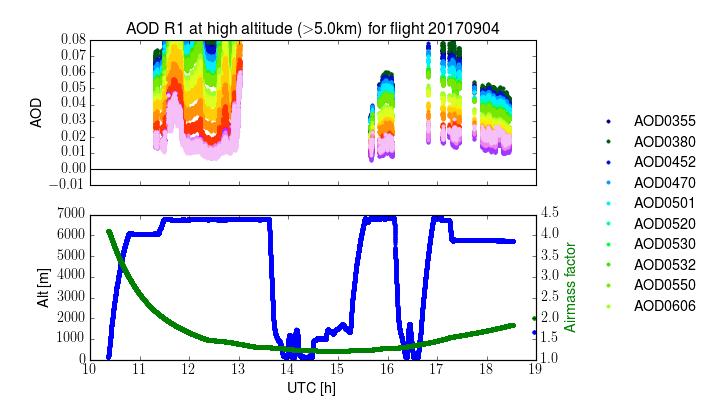

<IPython.core.display.Javascript object>


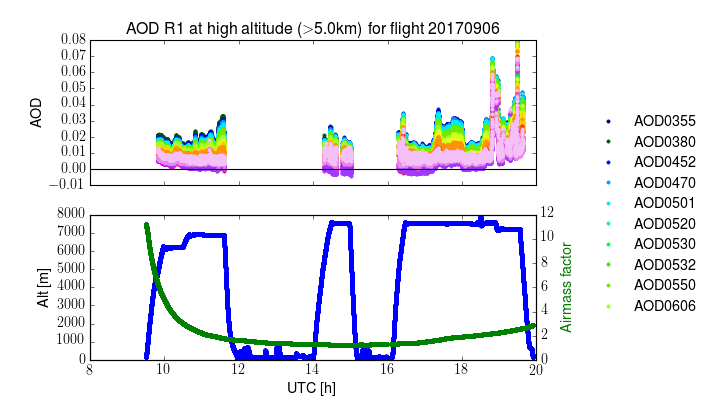

<IPython.core.display.Javascript object>


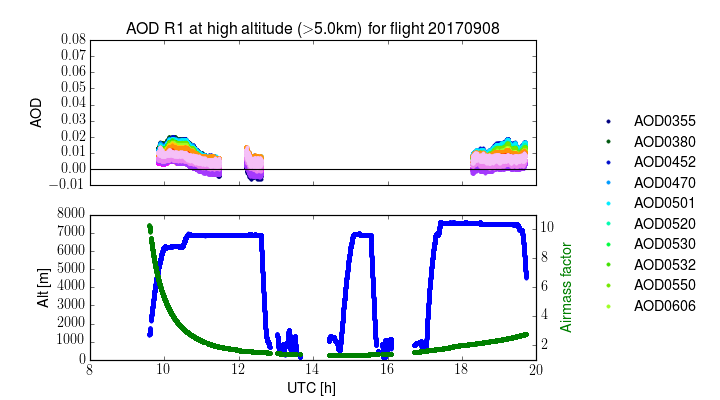

<IPython.core.display.Javascript object>


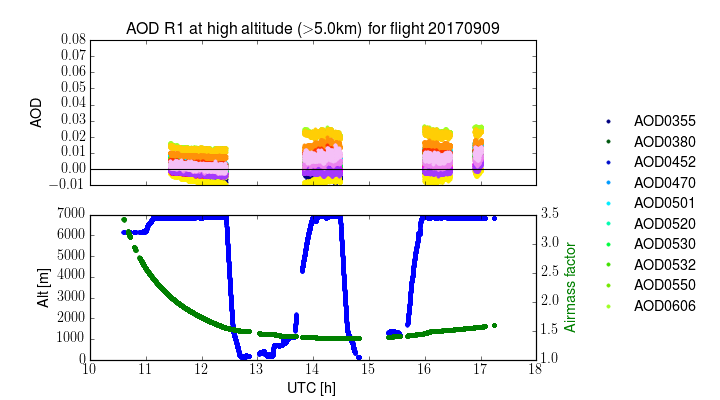

<IPython.core.display.Javascript object>


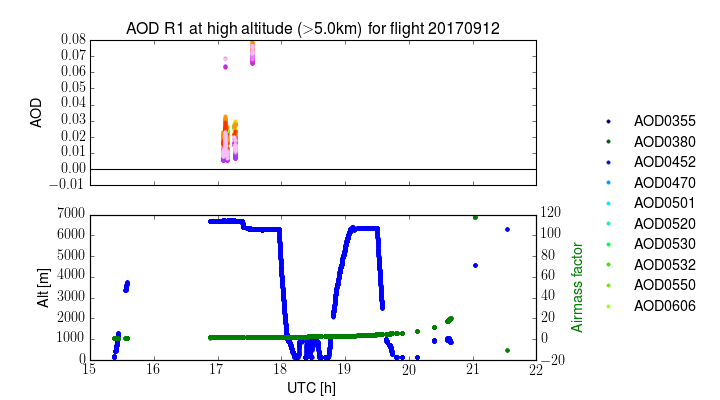

<IPython.core.display.Javascript object>


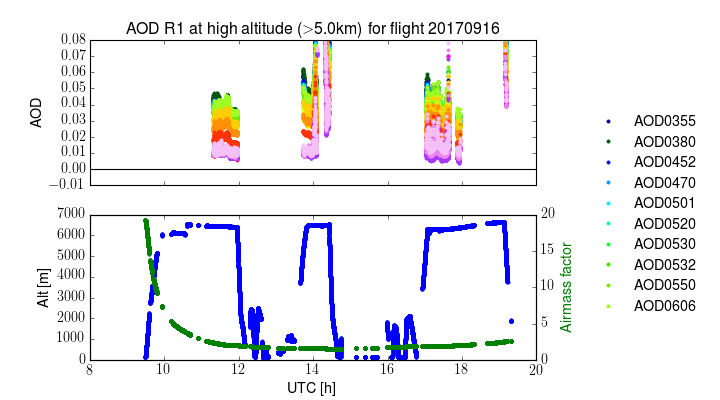

<IPython.core.display.Javascript object>


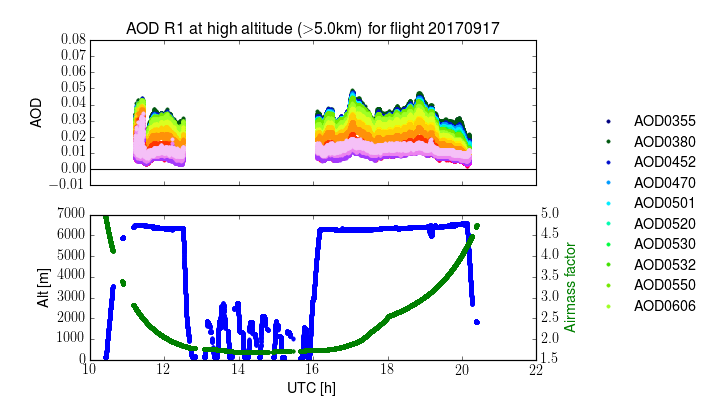

<IPython.core.display.Javascript object>


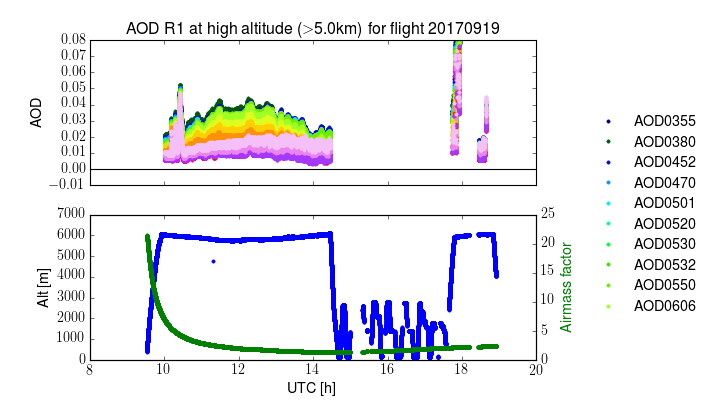

<IPython.core.display.Javascript object>


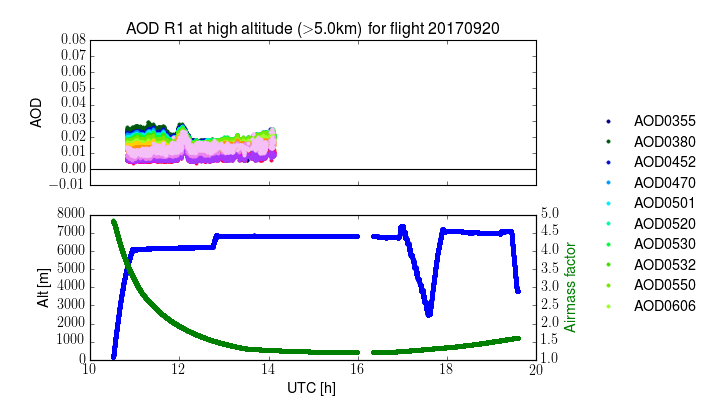

In [14]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(2,sharex=True,figsize=(9,5))
    ax = ax.ravel()
    ax[0].set_title('AOD {} at high altitude ($>$5.0km) for flight {}'.format(vv,d))
    ax[0].set_color_cycle([plt.cm.gist_ncar(k) for k in np.linspace(0, 1, len(wl)+1)])
    for aod in wl:
        ii = np.where((outaod_RA[i]['qual_flag']==0)&(outaod_RA[i]['GPS_Alt']>5000))[0]
        ax[0].plot(outaod_RA[i][nm[0]][ii],outaod_RA[i][aod][ii],'.',label=aod)
    ax[0].set_ylabel('AOD')
    ax[0].set_ylim(-0.01,0.08)
    ax[0].axhline(0,color='k')
    box = ax[0].get_position()
    ax[0].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[0].legend(frameon=False,loc='center left',bbox_to_anchor=(1.1,-0.2),numpoints=1,ncol=2)
    ax[1].plot(outaod_RA[i][nm[0]],outaod_RA[i]['GPS_Alt'],'.')
    ax[1].set_ylabel('Alt [m]')
    axy = ax[1].twinx()
    axy.plot(outaod_RA[i][nm[0]],outaod_RA[i]['amass_aer'],'.g')
    axy.set_ylabel('Airmass factor',color='g')
    box = ax[1].get_position()
    ax[1].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    box = axy.get_position()
    axy.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[1].set_xlabel('UTC [h]')
    plt.savefig(fp+'NAAMES3_aod_ict/{vi}/{vv}/{vv}_high_alt_AOD_{}.png'.format(d,vv=vv,vi=vi),dpi=600,transparent=True)

In [15]:
wl[0:15]

('AOD0355',
 'AOD0380',
 'AOD0452',
 'AOD0470',
 'AOD0501',
 'AOD0520',
 'AOD0530',
 'AOD0532',
 'AOD0550',
 'AOD0606',
 'AOD0620',
 'AOD0660',
 'AOD0675',
 'AOD0781',
 'AOD0865')

<IPython.core.display.Javascript object>


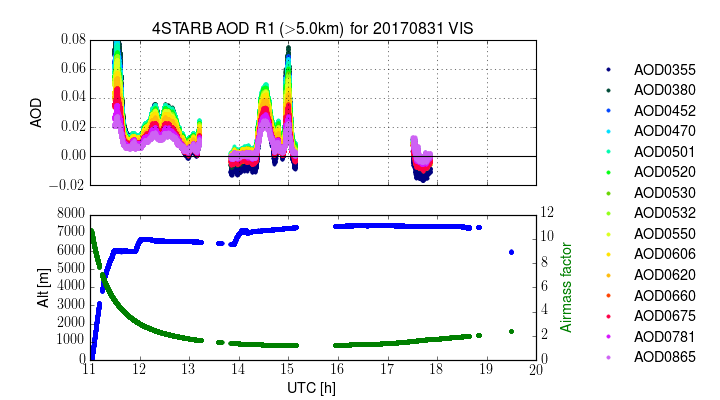

<IPython.core.display.Javascript object>


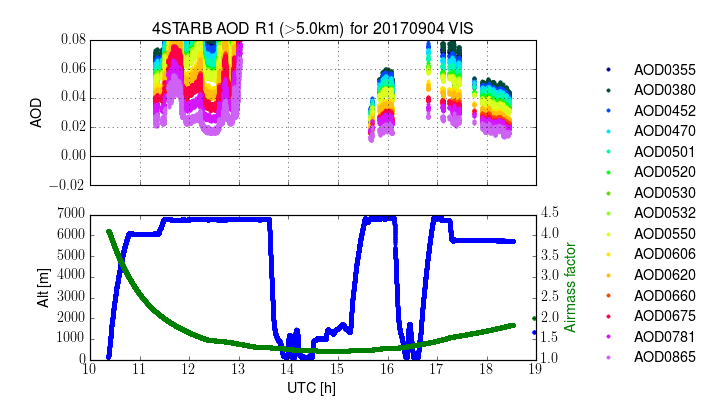

<IPython.core.display.Javascript object>


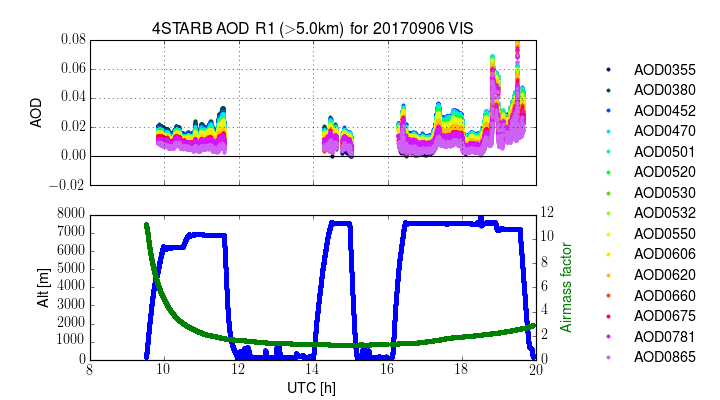

<IPython.core.display.Javascript object>


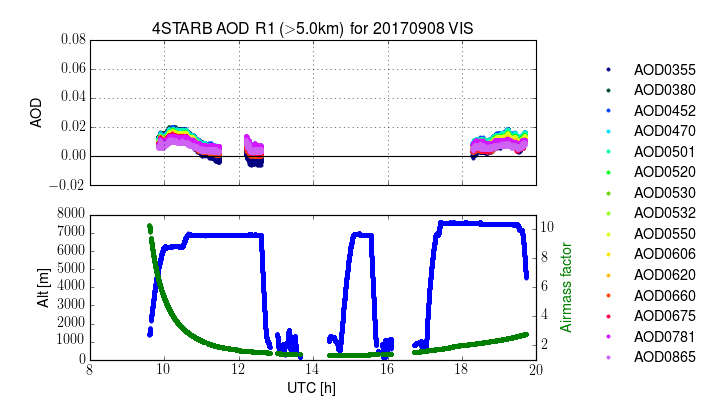

<IPython.core.display.Javascript object>


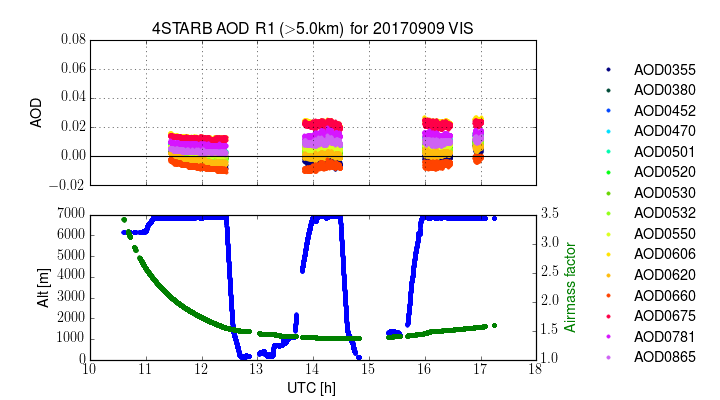

<IPython.core.display.Javascript object>


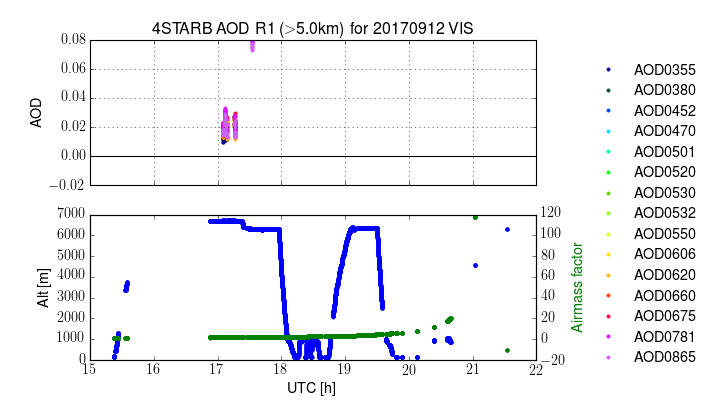

<IPython.core.display.Javascript object>


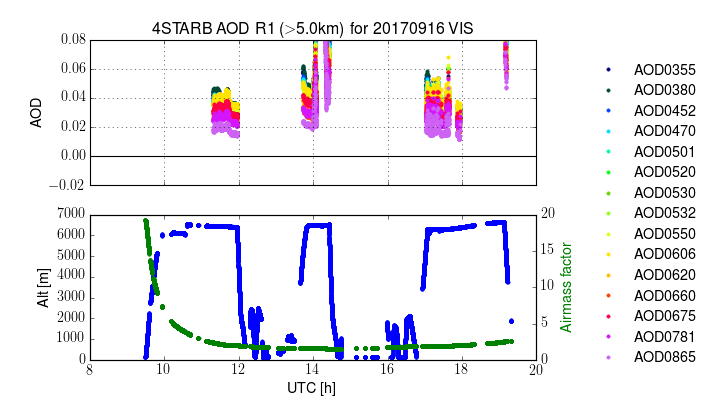

<IPython.core.display.Javascript object>


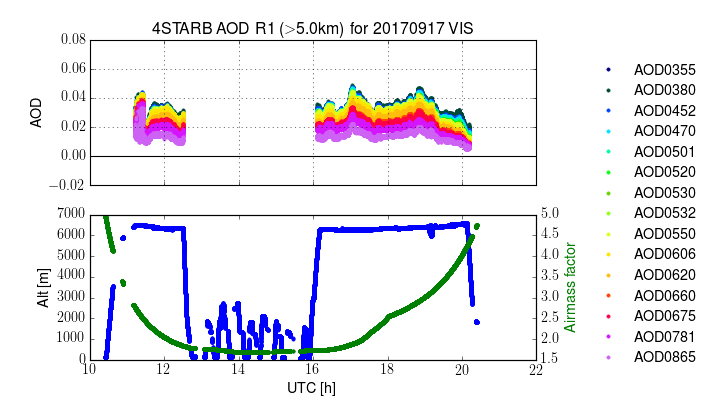

<IPython.core.display.Javascript object>


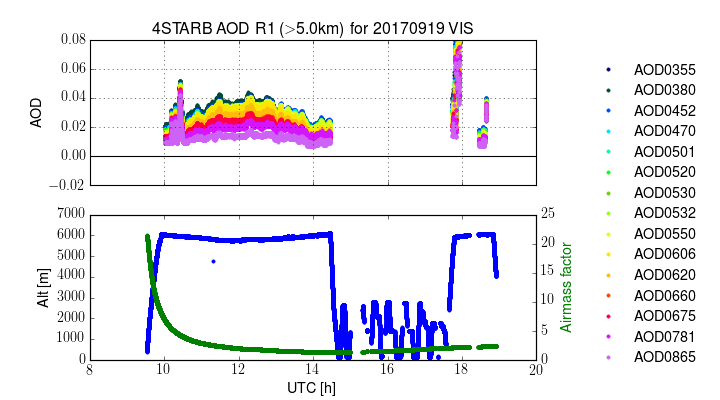

<IPython.core.display.Javascript object>


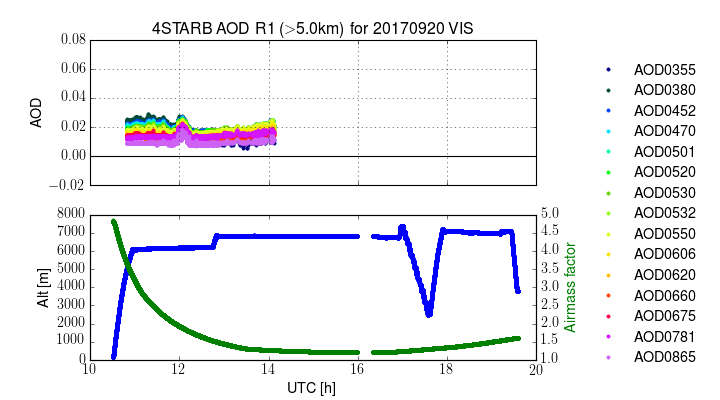

In [52]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(2,sharex=True,figsize=(9,5))
    ax = ax.ravel()
    ax[0].set_title('4STARB AOD {} ($>$5.0km) for {} VIS'.format(vv,d))
    ax[0].set_color_cycle([plt.cm.gist_ncar(k) for k in np.linspace(0, 1, len(wl[0:16])+1)])
    for aod in wl[0:15]:
        ii = np.where((outaod_RA[i]['qual_flag']==0)&(outaod_RA[i]['GPS_Alt']>5000))[0]
        ax[0].plot(outaod_RA[i][nm[0]][ii],outaod_RA[i][aod][ii],'.',label=aod)
    ax[0].set_ylabel('AOD')
    ax[0].set_ylim(-0.02,0.08)
    ax[0].grid()
    ax[0].axhline(0,color='k')
    box = ax[0].get_position()
    ax[0].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[0].legend(frameon=False,loc='center left',bbox_to_anchor=(1.1,-0.2),numpoints=1)
    ax[1].plot(outaod_RA[i][nm[0]],outaod_RA[i]['GPS_Alt'],'.')
    ax[1].set_ylabel('Alt [m]')
    axy = ax[1].twinx()
    axy.plot(outaod_RA[i][nm[0]],outaod_RA[i]['amass_aer'],'.g')
    axy.set_ylabel('Airmass factor',color='g')
    box = ax[1].get_position()
    ax[1].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    box = axy.get_position()
    axy.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[1].set_xlabel('UTC [h]')
    plt.savefig(fp+'NAAMES3_aod_ict/{vi}/{vv}/{vv}_high_alt_AOD_{vi}_{}_vis.png'.format(d,vv=vv,vi=vi),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


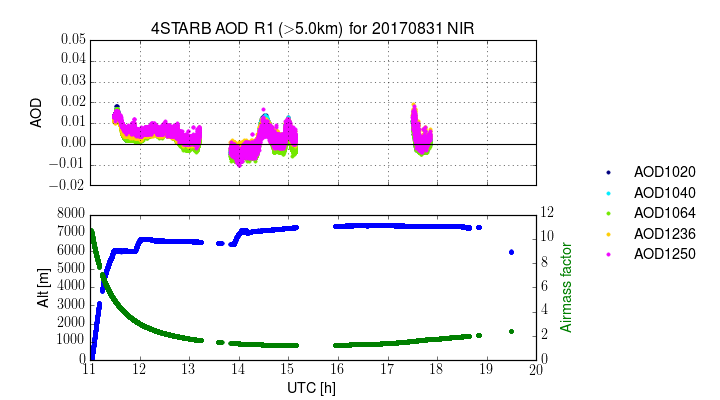

<IPython.core.display.Javascript object>


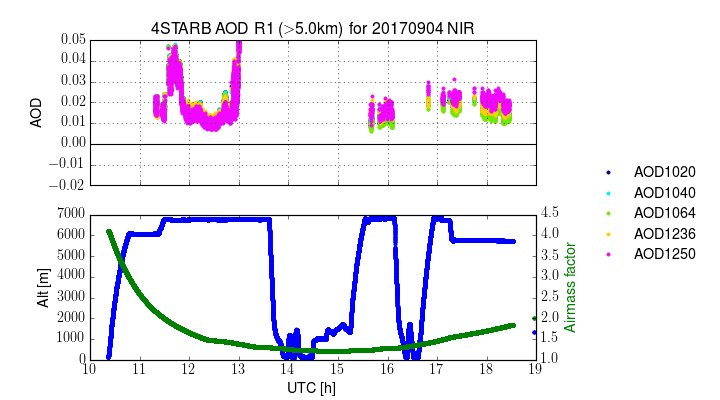

<IPython.core.display.Javascript object>


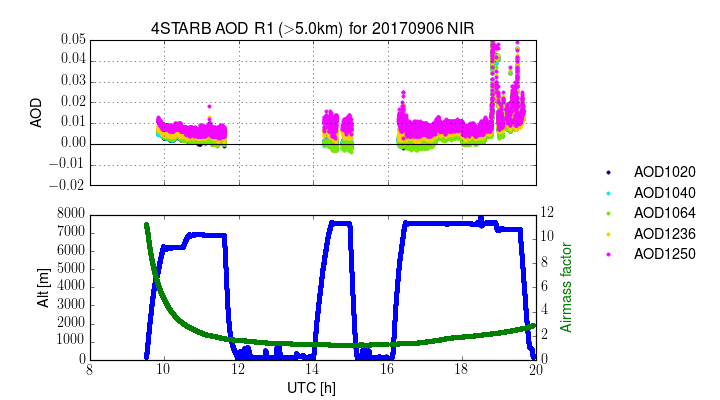

<IPython.core.display.Javascript object>


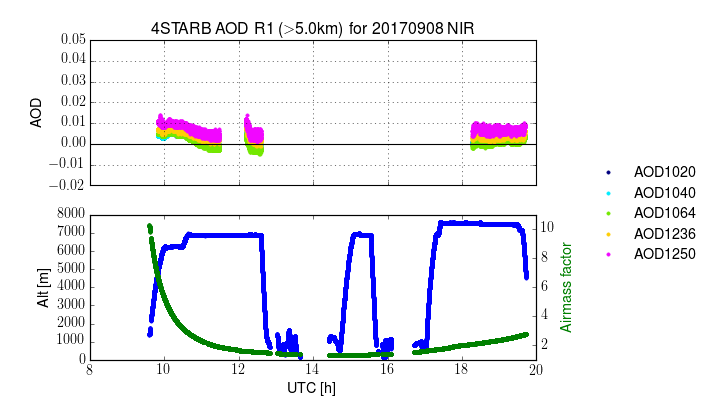

<IPython.core.display.Javascript object>


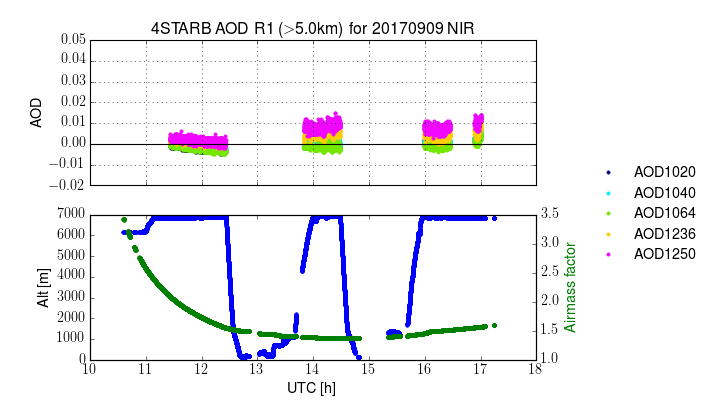

<IPython.core.display.Javascript object>


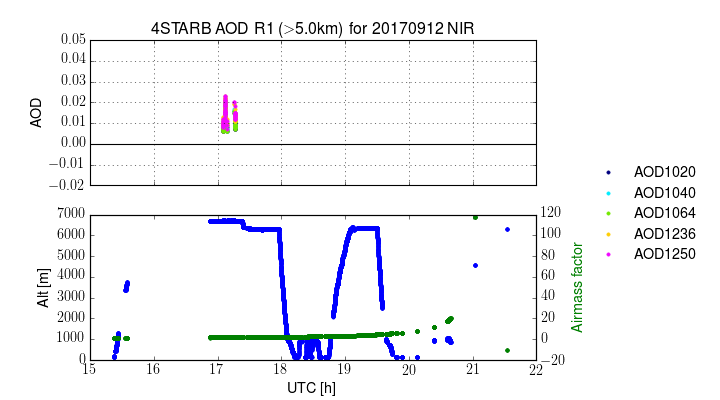

<IPython.core.display.Javascript object>


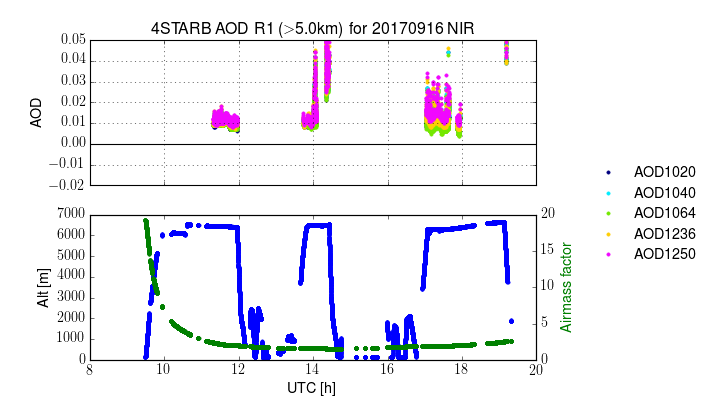

<IPython.core.display.Javascript object>


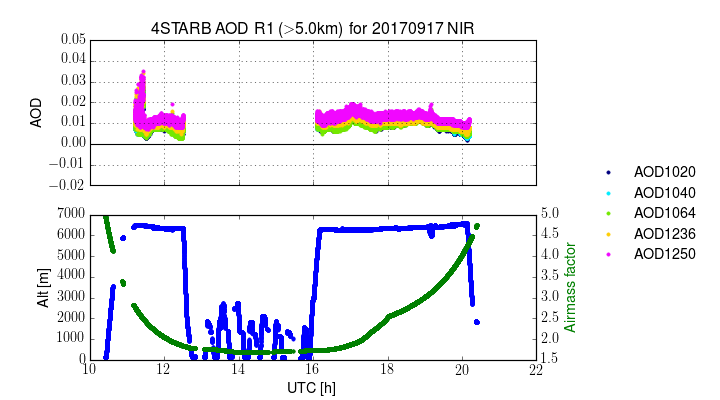

<IPython.core.display.Javascript object>


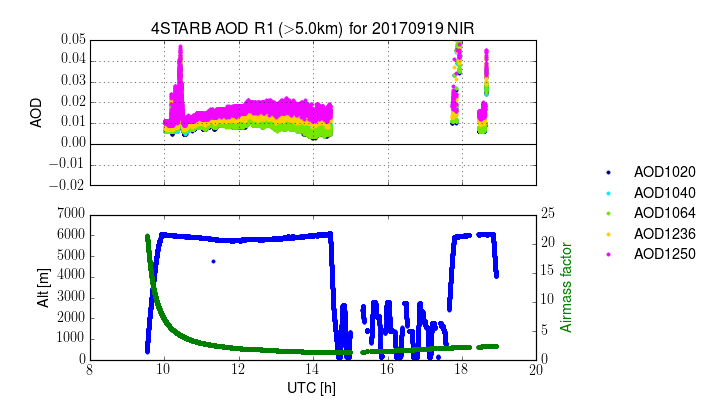

<IPython.core.display.Javascript object>


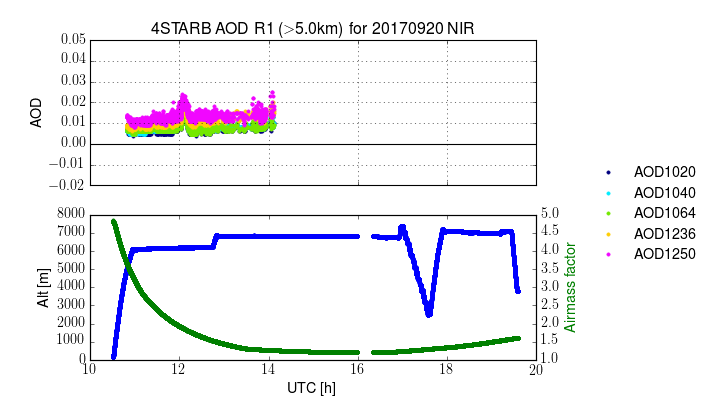

In [17]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(2,sharex=True,figsize=(9,5))
    ax = ax.ravel()
    ax[0].set_title('4STARB AOD {} ($>$5.0km) for {} NIR'.format(vv,d))
    ax[0].set_color_cycle([plt.cm.gist_ncar(k) for k in np.linspace(0, 1, len(wl[15:])+1)])
    for aod in wl[15:]:
        ii = np.where((outaod_RA[i]['qual_flag']==0)&(outaod_RA[i]['GPS_Alt']>5000))[0]
        ax[0].plot(outaod_RA[i][nm[0]][ii],outaod_RA[i][aod][ii],'.',label=aod)
    ax[0].set_ylabel('AOD')
    ax[0].set_ylim(-0.02,0.05)
    ax[0].grid()
    ax[0].axhline(0,color='k')
    box = ax[0].get_position()
    ax[0].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[0].legend(frameon=False,loc='center left',bbox_to_anchor=(1.1,-0.2),numpoints=1)
    ax[1].plot(outaod_RA[i][nm[0]],outaod_RA[i]['GPS_Alt'],'.')
    ax[1].set_ylabel('Alt [m]')
    axy = ax[1].twinx()
    axy.plot(outaod_RA[i][nm[0]],outaod_RA[i]['amass_aer'],'.g')
    axy.set_ylabel('Airmass factor',color='g')
    box = ax[1].get_position()
    ax[1].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    box = axy.get_position()
    axy.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[1].set_xlabel('UTC [h]')
    plt.savefig(fp+'NAAMES3_aod_ict/{vi}/{vv}/{vv}_high_alt_AOD_{vi}_{}_nir.png'.format(d,vv=vv,vi=vi),dpi=600,transparent=True)

## Plot the AOD with the uncertainty

In [18]:
nm[-20:-5]

('UNCAOD0355',
 'UNCAOD0380',
 'UNCAOD0452',
 'UNCAOD0470',
 'UNCAOD0501',
 'UNCAOD0520',
 'UNCAOD0530',
 'UNCAOD0532',
 'UNCAOD0550',
 'UNCAOD0606',
 'UNCAOD0620',
 'UNCAOD0660',
 'UNCAOD0675',
 'UNCAOD0781',
 'UNCAOD0865')

<IPython.core.display.Javascript object>


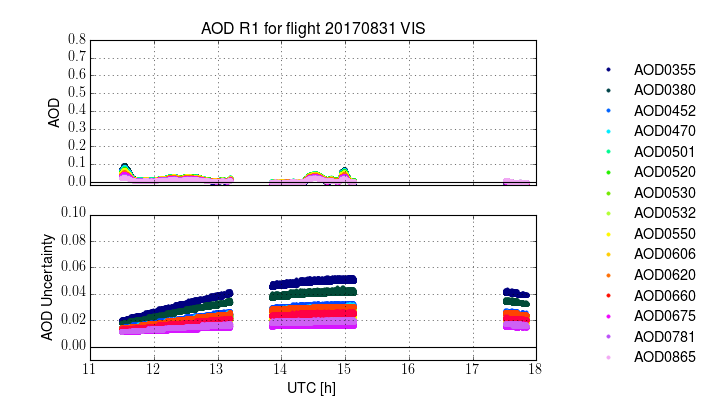

<IPython.core.display.Javascript object>


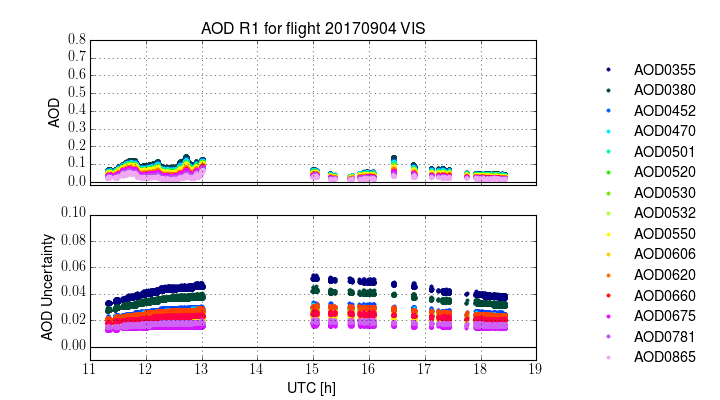

<IPython.core.display.Javascript object>


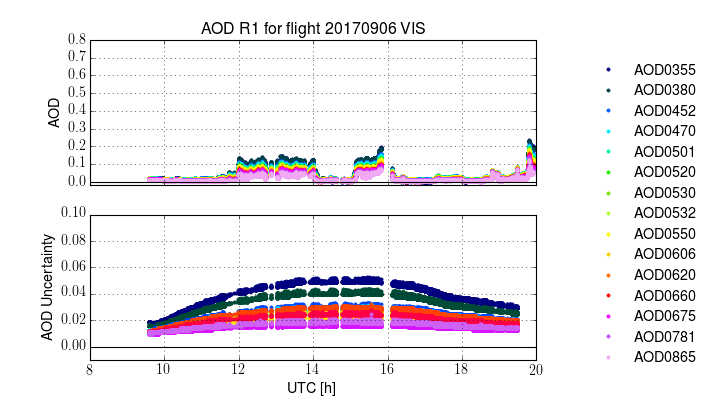

<IPython.core.display.Javascript object>


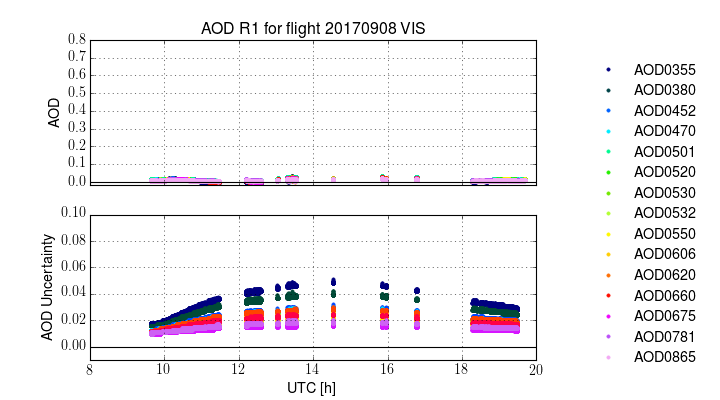

<IPython.core.display.Javascript object>


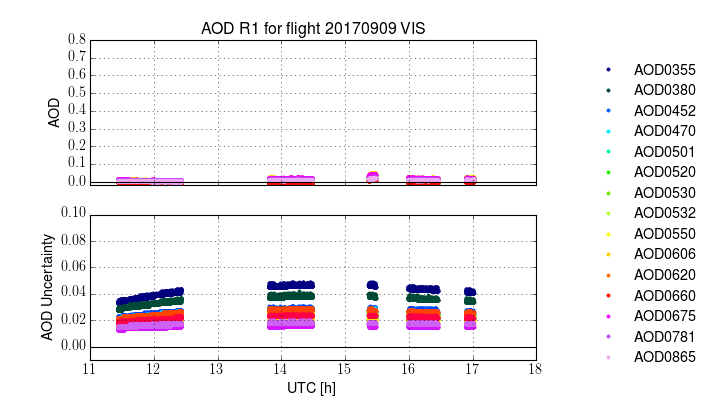

<IPython.core.display.Javascript object>


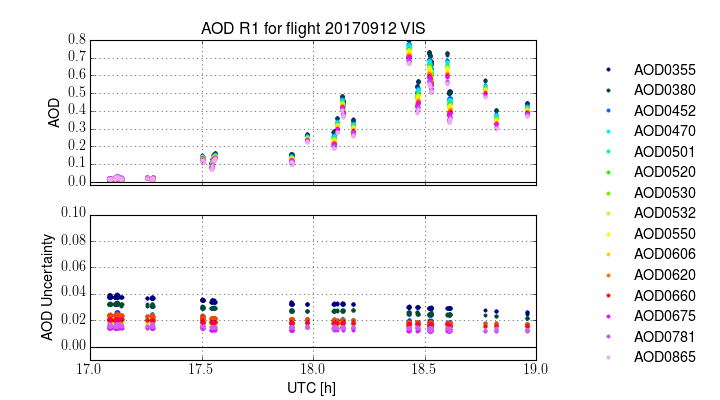

<IPython.core.display.Javascript object>


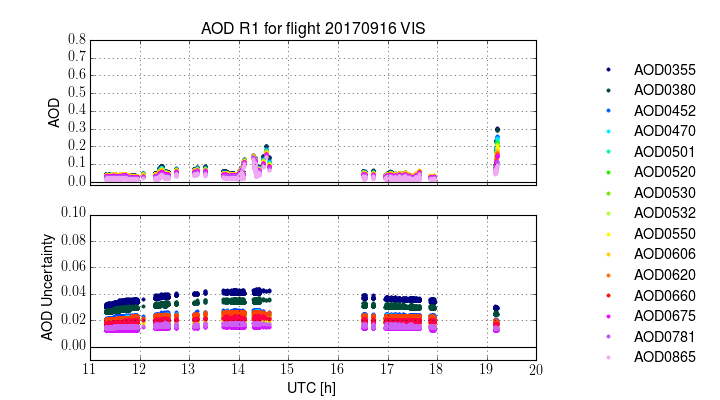

<IPython.core.display.Javascript object>


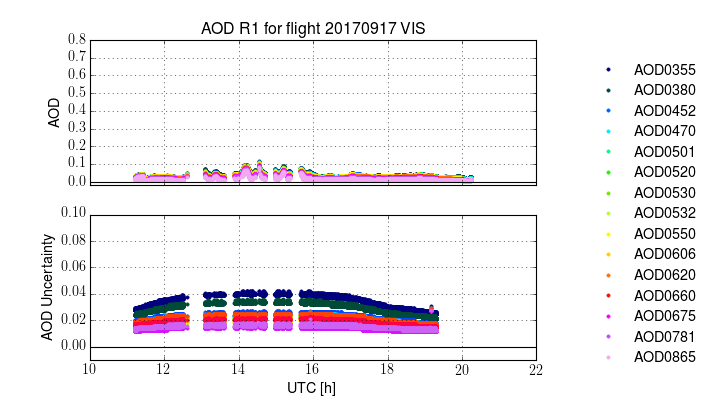

<IPython.core.display.Javascript object>


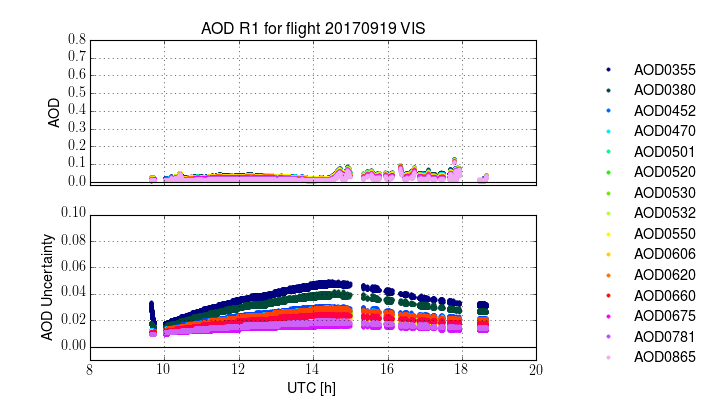

<IPython.core.display.Javascript object>


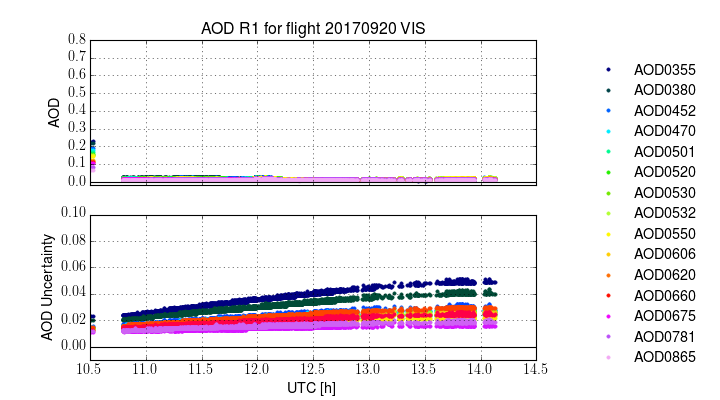

In [51]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(2,sharex=True,figsize=(9,5))
    ax = ax.ravel()
    ax[0].set_title('AOD {} for flight {} VIS'.format(vv,d))
    ax[0].set_color_cycle([plt.cm.gist_ncar(k) for k in np.linspace(0, 1, len(wl[0:15])+1)])
    for aod in wl[0:15]:
        ii = np.where((outaod_RA[i]['qual_flag']==0))[0]
        ax[0].plot(outaod_RA[i][nm[0]][ii],outaod_RA[i][aod][ii],'.',label=aod)
    ax[0].set_ylabel('AOD')
    ax[0].set_ylim(-0.02,0.8)
    ax[0].grid()
    ax[0].axhline(0,color='k')
    box = ax[0].get_position()
    ax[0].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[0].legend(frameon=False,loc='center left',bbox_to_anchor=(1.1,-0.2),numpoints=1)
    ax[1].set_color_cycle([plt.cm.gist_ncar(k) for k in np.linspace(0, 1, len(wl[0:16])+1)])
    for unc in nm[-20:-5]:
        ii = np.where((outaod_RA[i][nm[4]]==0))[0]
        ax[1].plot(outaod_RA[i][nm[0]][ii],outaod_RA[i][unc][ii],'.',label=aod)
    ax[1].set_ylabel('AOD Uncertainty')
    ax[1].set_ylim(-0.01,0.1)
    ax[1].grid()
    ax[1].axhline(0,color='k')
    
    box = ax[1].get_position()
    ax[1].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[1].set_xlabel('UTC [h]')
    plt.savefig(fp+'NAAMES3_aod_ict/{vi}/{vv}/{vv}_AOD_uncert_{vi}_{}_vis.png'.format(d,vv=vv,vi=vi),dpi=600,transparent=True)

In [20]:
nm[-5:]

('UNCAOD1020', 'UNCAOD1040', 'UNCAOD1064', 'UNCAOD1236', 'UNCAOD1250')

In [21]:
nm[46:-1]

('UNCAOD1236',)

<IPython.core.display.Javascript object>


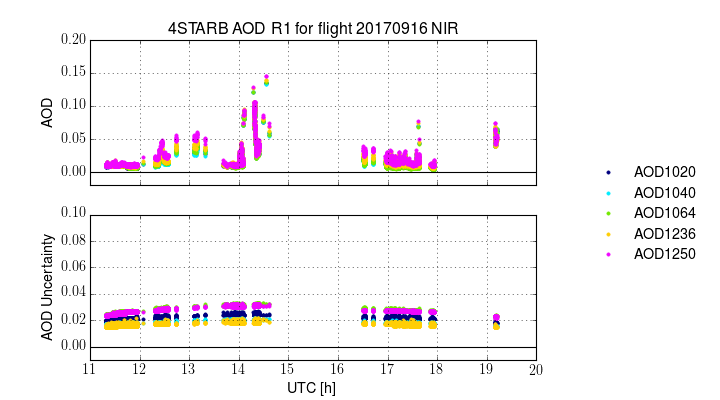

<IPython.core.display.Javascript object>


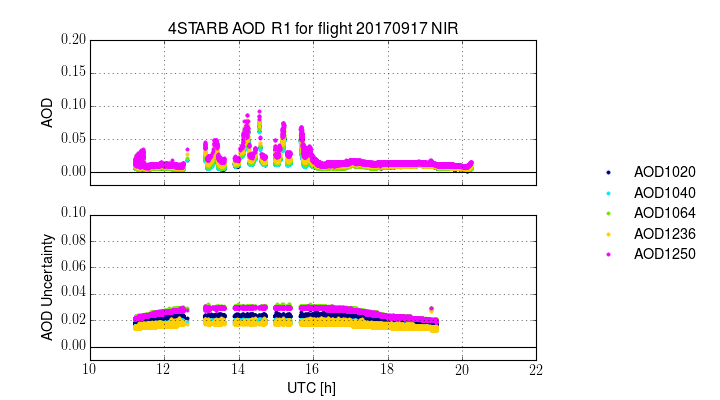

<IPython.core.display.Javascript object>


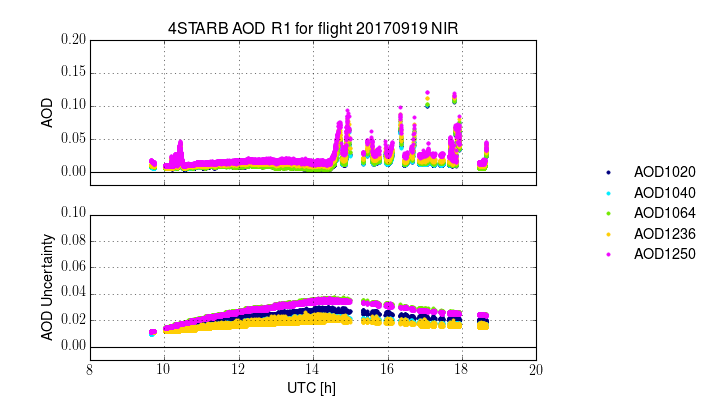

<IPython.core.display.Javascript object>


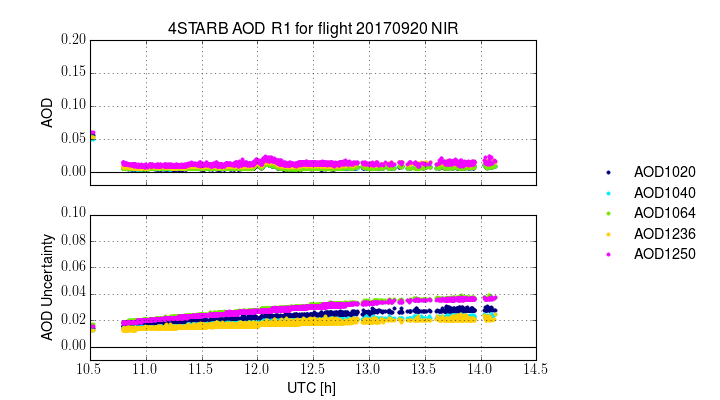

In [47]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(2,sharex=True,figsize=(9,5))
    ax = ax.ravel()
    ax[0].set_title('4STARB AOD {} for flight {} NIR'.format(vv,d))
    ax[0].set_color_cycle([plt.cm.gist_ncar(k) for k in np.linspace(0, 1, len(wl[15:])+1)])
    for aod in wl[15:]:
        ii = np.where((outaod_RA[i]['qual_flag']==0))[0]
        ax[0].plot(outaod_RA[i][nm[0]][ii],outaod_RA[i][aod][ii],'.',label=aod)
    ax[0].set_ylabel('AOD')
    ax[0].set_ylim(-0.02,0.2)
    ax[0].grid()
    ax[0].axhline(0,color='k')
    box = ax[0].get_position()
    ax[0].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[0].legend(frameon=False,loc='center left',bbox_to_anchor=(1.1,-0.2),numpoints=1)
    ax[1].set_color_cycle([plt.cm.gist_ncar(k) for k in np.linspace(0, 1, len(nm[-5:])+1)])
    for unc in nm[-5:]:
        ii = np.where((outaod_RA[i]['qual_flag']==0))[0]
        ax[1].plot(outaod_RA[i][nm[0]][ii],outaod_RA[i][unc][ii],'.',label=aod)
    ax[1].set_ylabel('AOD Uncertainty')
    ax[1].set_ylim(-0.01,0.1)
    ax[1].grid()
    ax[1].axhline(0,color='k')
    
    box = ax[1].get_position()
    ax[1].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[1].set_xlabel('UTC [h]')
    plt.savefig(fp+'NAAMES3_aod_ict/{vi}/{vv}/{vv}_AOD_uncert_{vi}_{}_nir.png'.format(d,vv=vv,vi=vi),dpi=600,transparent=True)

## Plot spectral aod figures for high altitude

In [23]:
wv = [float(v[3:]) for v in wl]

In [24]:
wv

[355.0,
 380.0,
 452.0,
 470.0,
 501.0,
 520.0,
 530.0,
 532.0,
 550.0,
 606.0,
 620.0,
 660.0,
 675.0,
 781.0,
 865.0,
 1020.0,
 1040.0,
 1064.0,
 1236.0,
 1250.0]

<IPython.core.display.Javascript object>


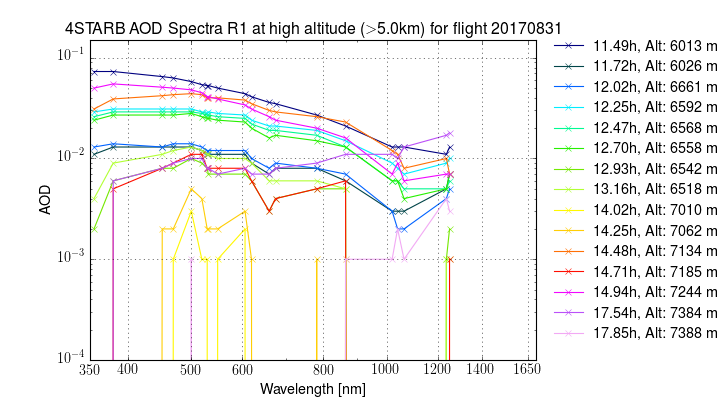

<IPython.core.display.Javascript object>


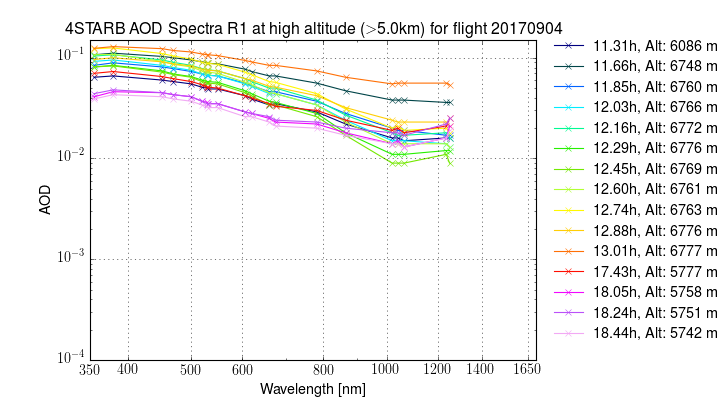

<IPython.core.display.Javascript object>


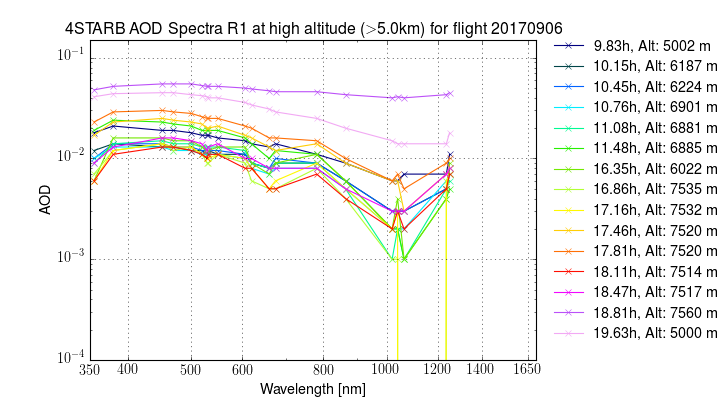

<IPython.core.display.Javascript object>


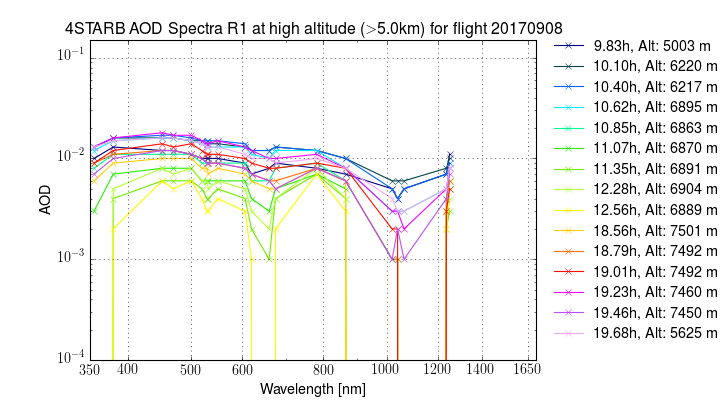

<IPython.core.display.Javascript object>


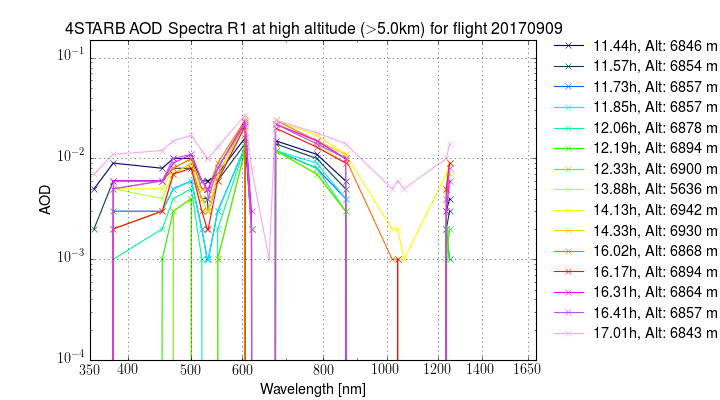

<IPython.core.display.Javascript object>


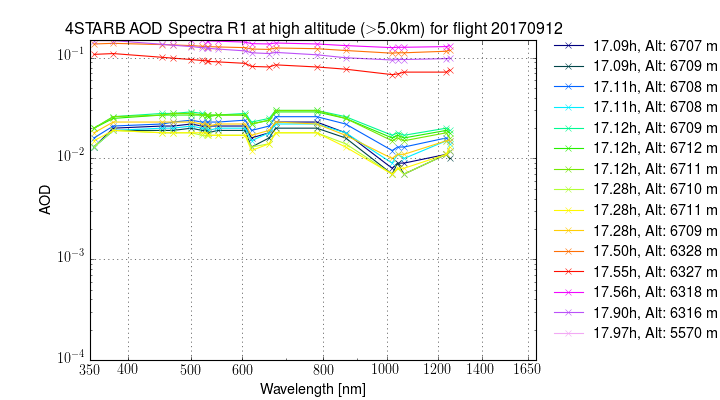

<IPython.core.display.Javascript object>


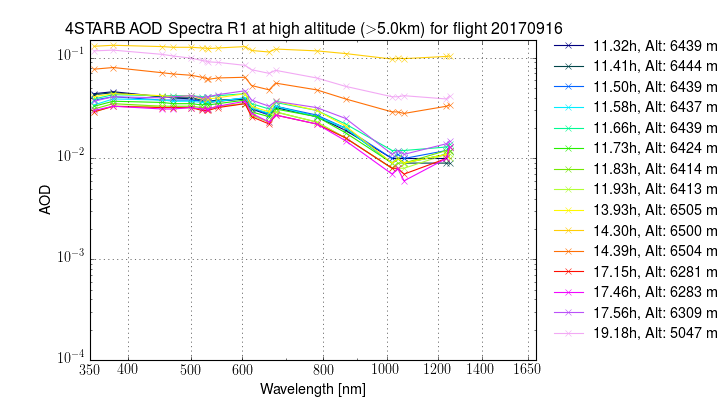

<IPython.core.display.Javascript object>


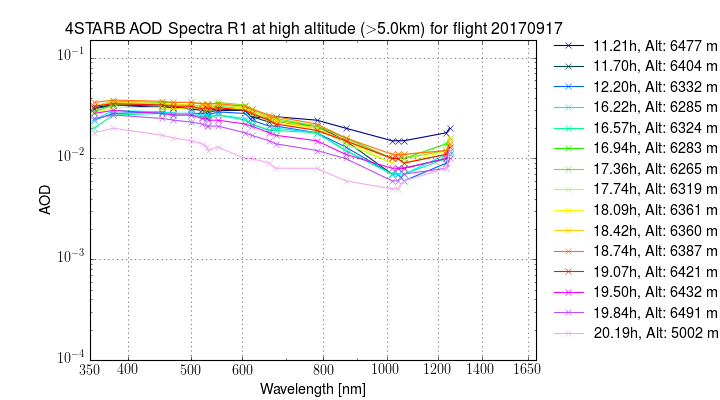

<IPython.core.display.Javascript object>


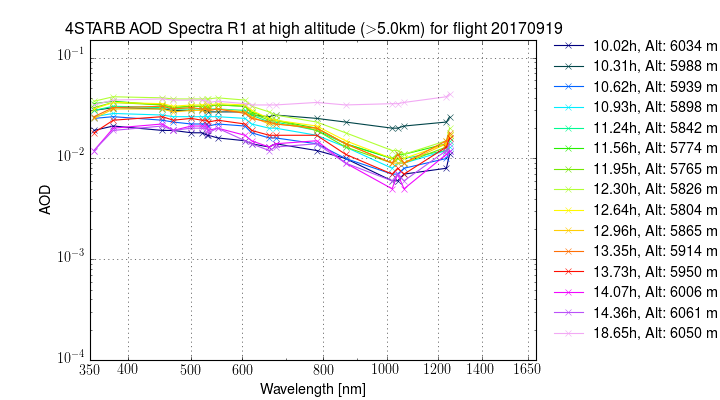

<IPython.core.display.Javascript object>


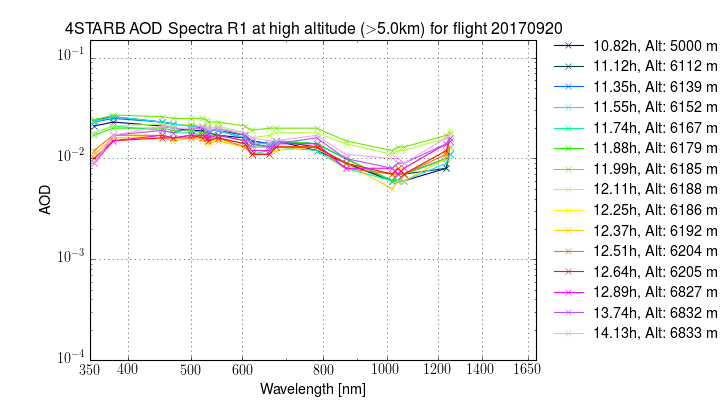

In [25]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(1,sharex=True,figsize=(9,5))
    #ax = ax.ravel()
    ax.set_title('4STARB AOD Spectra {} at high altitude ($>$5.0km) for flight {}'.format(vv,d))
    ii = np.where((outaod_RA[i][nm[4]]==0)&(outaod_RA[i]['GPS_Alt']>5000))[0]
    if not any(ii): continue
    js = np.linspace(0,len(ii)-1,15).astype(int)
    ax.set_color_cycle([plt.cm.gist_ncar(k) for k in np.linspace(0, 1, 16)])
    for j in js:
        sp = np.array([outaod_RA[i][n][ii[j]] for n in wl])
        fo = {'u':outaod_RA[i]['Start_UTC'][ii[j]],'a':outaod_RA[i]['GPS_Alt'][ii[j]]}
        if not np.isfinite(sp).any(): continue
        if any(sp>0.0):
            ax.plot(wv,sp,'x-',label='{u:5.2f}h, Alt: {a:5.0f} m'.format(**fo))
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_ylabel('AOD')
    ax.set_ylim(0.0001,0.15)
    ax.set_xlabel('Wavelength [nm]')
    ax.set_xlim(350.0,1700.0)
    plt.xticks([350,400,500,600,800,1000,1200,1400,1650])
    
    ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax.legend(frameon=False,loc='upper left',bbox_to_anchor=(1.01,1.04),numpoints=1)
    ax.grid()
    plt.savefig(fp+'NAAMES3_aod_ict/{vi}/{vv}/{vv}_high_alt_AOD_spectra_{vi}_{}.png'.format(d,vv=vv,vi=vi),
                dpi=600,transparent=True)

## Special case plotting

### Special plotting of AOD per altitude and latitude

In [26]:
days

['20170831',
 '20170904',
 '20170906',
 '20170908',
 '20170909',
 '20170912',
 '20170916',
 '20170917',
 '20170919',
 '20170920']

<IPython.core.display.Javascript object>


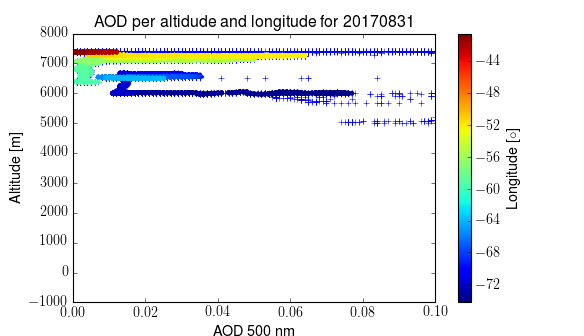

<IPython.core.display.Javascript object>


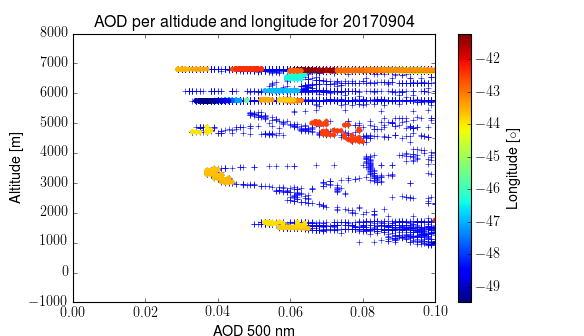

<IPython.core.display.Javascript object>


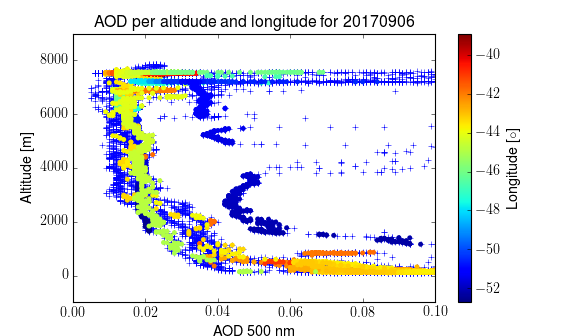

<IPython.core.display.Javascript object>


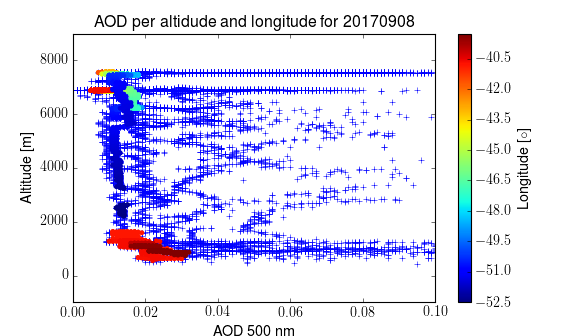

<IPython.core.display.Javascript object>


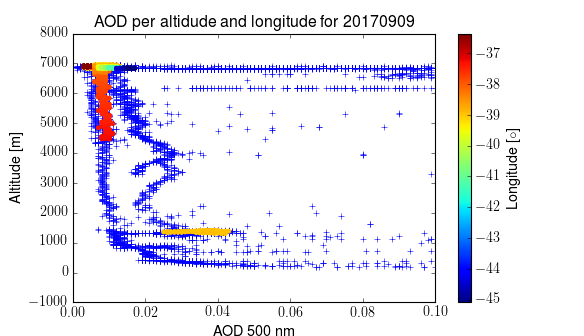

<IPython.core.display.Javascript object>


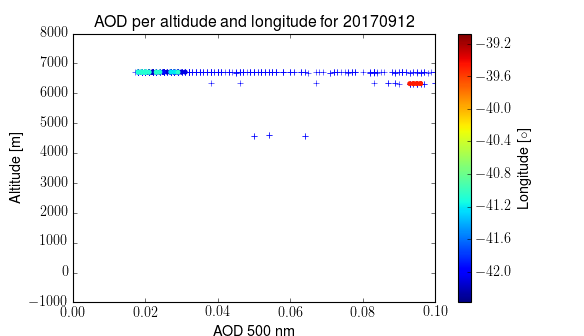

<IPython.core.display.Javascript object>


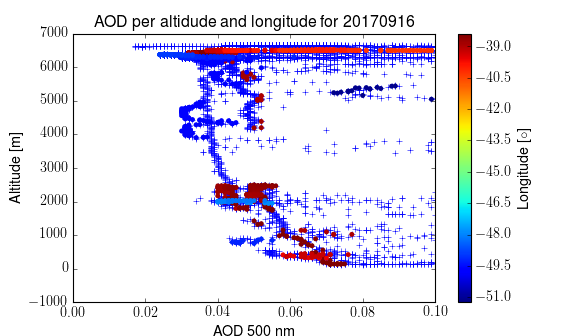

<IPython.core.display.Javascript object>


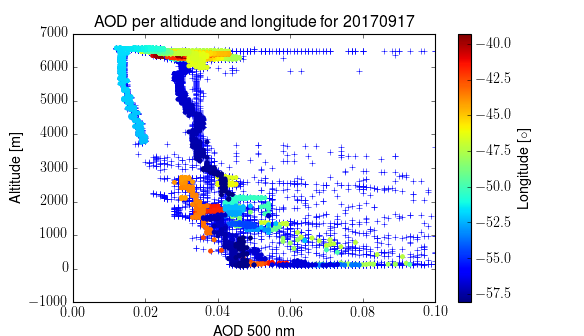

<IPython.core.display.Javascript object>


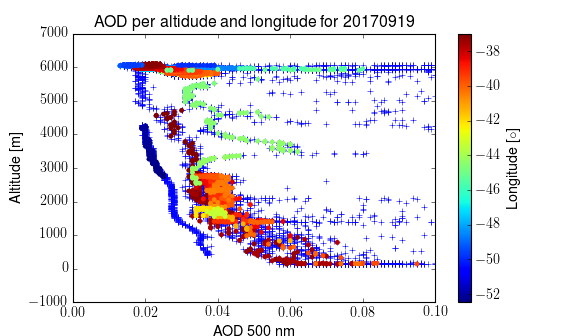

<IPython.core.display.Javascript object>


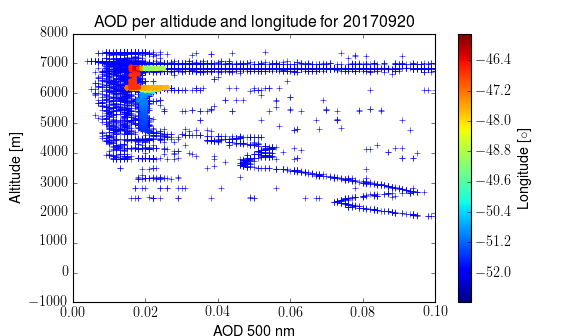

In [27]:
for i,d in enumerate(days):
    plt.figure()
    plt.plot(outaod_RA[i]['AOD0501'],outaod_RA[i]['GPS_Alt'],'+',zorder=0)
    b = plt.scatter(outaod_RA[i]['AOD0501'][outaod_RA[i]['qual_flag']==0],outaod_RA[i]['GPS_Alt'][outaod_RA[i]['qual_flag']==0],
                marker='o',edgecolor='None',c=outaod_RA[i]['Longitude'][outaod_RA[i]['qual_flag']==0])
    #plt.axhline(600)
    #plt.axhline(1200)
    plt.xlim(0,0.1)
    plt.xlabel('AOD 500 nm')
    plt.ylabel('Altitude [m]')
    plt.title('AOD per altidude and longitude for {}'.format(d))
    try:
        cb = plt.colorbar(b)
        cb.set_label('Longitude [$\\circ$]')
    except:
        pass
    plt.savefig(fp+'NAAMES3_aod_ict/{vi}/{vv}/{vv}_{}_aod_alt_lon.png'.format(d,vv=vv,vi=vi),dpi=600,transparent=True)

## Make plots of angstrom exponent

In [28]:
wls = [0.38,0.452,0.501,0.520,0.532,0.55,0.606,0.620,0.675,0.781,0.865,1.02,1.04,1.064,1.236,1.559]

In [29]:
wls = np.array(wv)/1000.0

In [30]:
aodrr, angarr = [],[]
for i,d in enumerate(days):
    aodarr = []
    for w in wl:
        aodarr.append(outaod_RA[i][w])
    aodarr = np.array(aodarr)

    #ang = calc_angs(outaod_RA[i][nm[0]],wls,aodarr,outaod_RA[i][nm[4]])
    aodrr.append(aodarr)
    angarr.append(np.array(outaod_RA[i]['AOD_angstrom_470_865']))

<IPython.core.display.Javascript object>


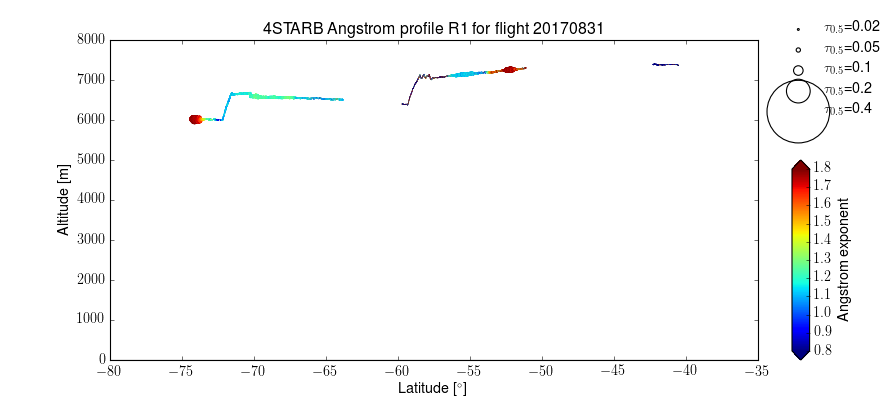

<IPython.core.display.Javascript object>


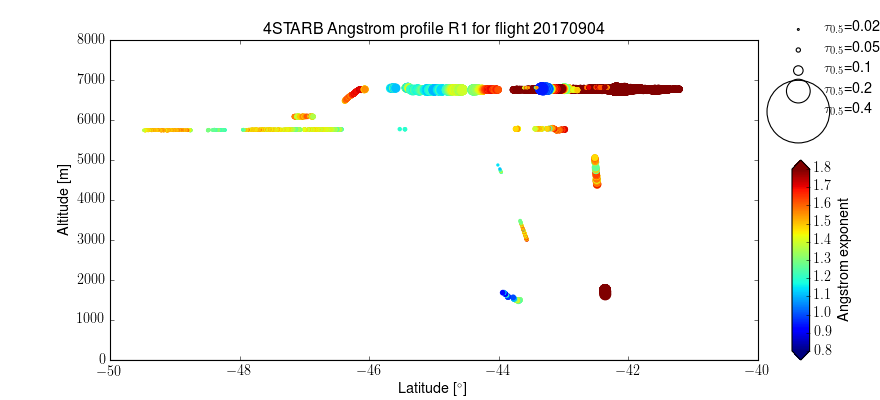

<IPython.core.display.Javascript object>


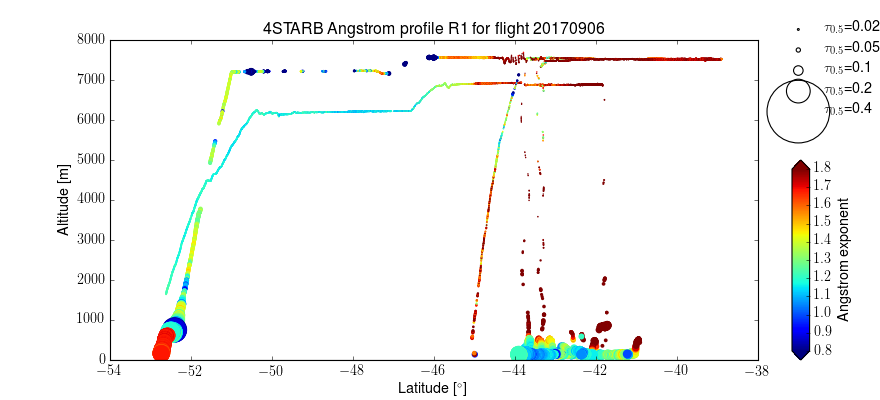

<IPython.core.display.Javascript object>


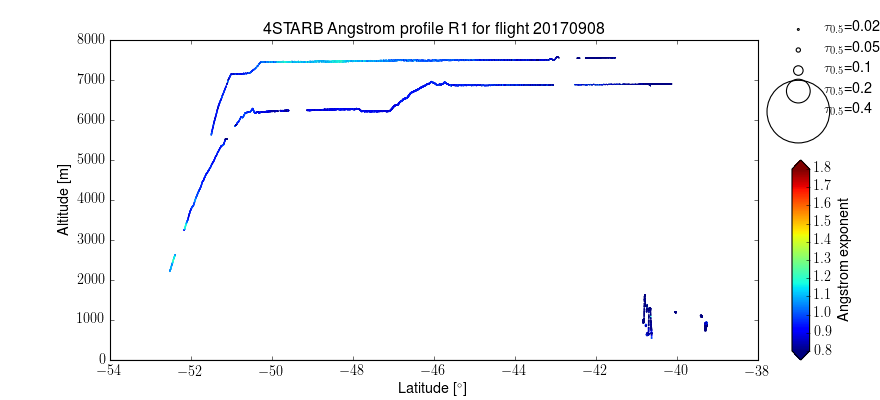

<IPython.core.display.Javascript object>


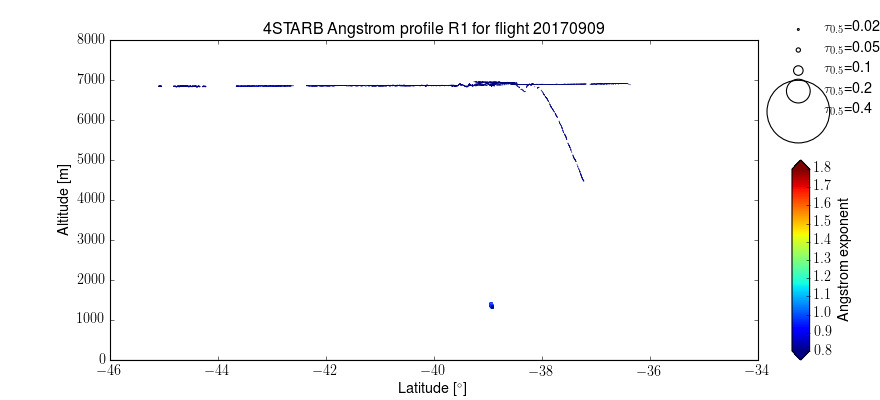

<IPython.core.display.Javascript object>


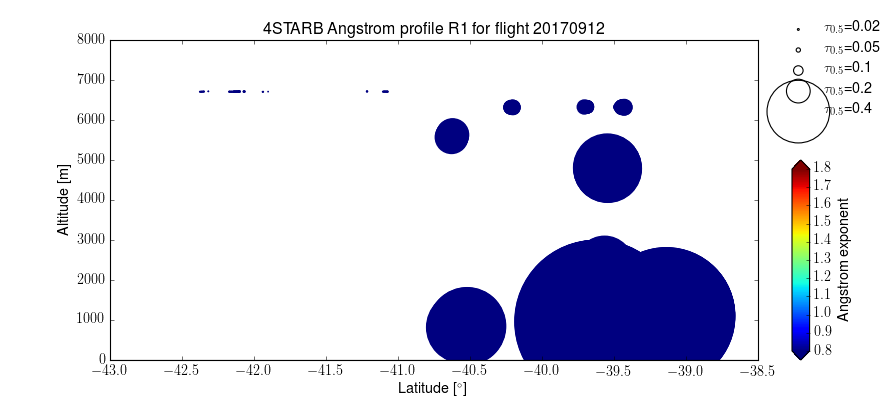

<IPython.core.display.Javascript object>


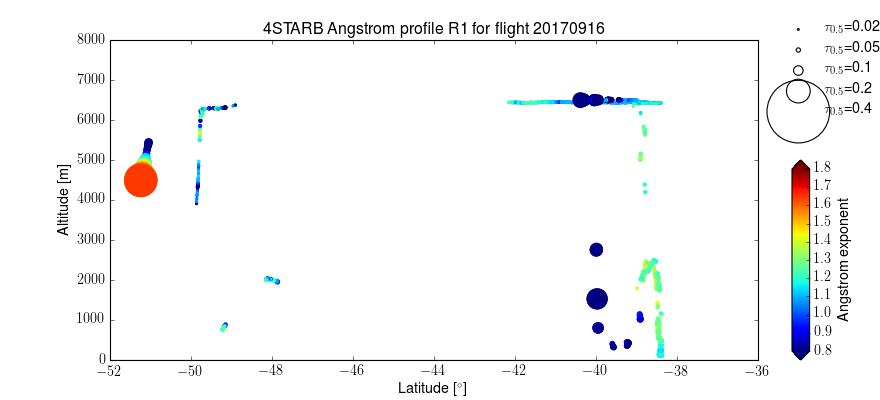

<IPython.core.display.Javascript object>


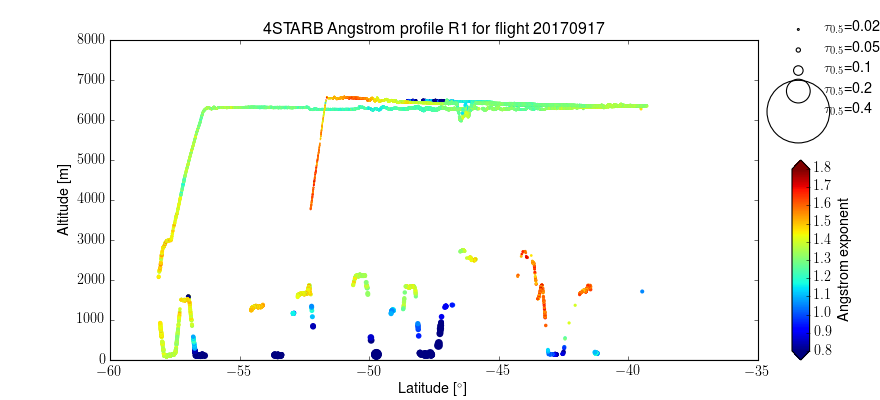

<IPython.core.display.Javascript object>


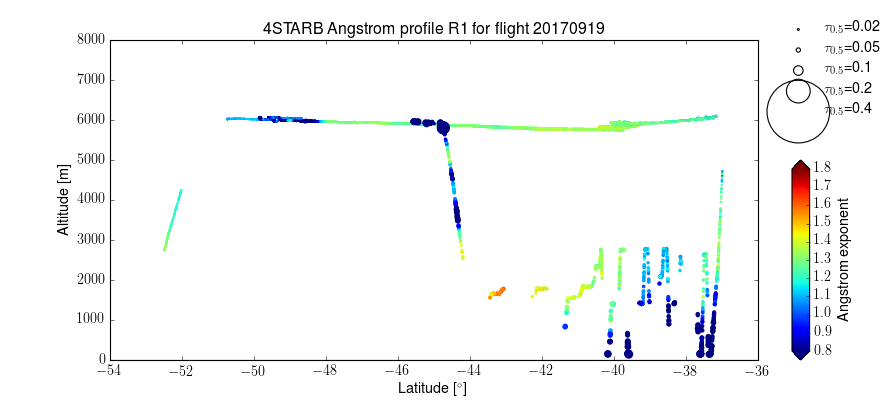

<IPython.core.display.Javascript object>


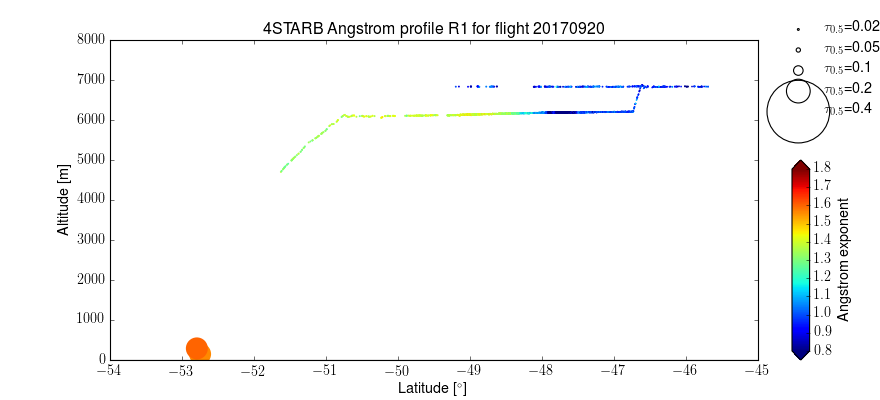

In [31]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(1,sharex=True,figsize=(11,5))
    ax.set_title('4STARB Angstrom profile {} for flight {}'.format(vv,d))
    qa = [outaod_RA[i]['qual_flag']==0]
    try:
        v = ax.scatter(outaod_RA[i]['Longitude'][qa],outaod_RA[i]['GPS_Alt'][qa],(35*(outaod_RA[i][wl[2]][qa]+0.02))**3.0,
                       c=outaod_RA[i]['AOD_angstrom_470_865'][qa],marker='o',edgecolor='None',vmin=0.8,vmax=1.8)
    except:
        v = ax.scatter(outaod_RA[i]['Longitude'][qa],outaod_RA[i]['GPS_Alt'][qa],(35*(outaod_RA[i][wl[2]][qa]+0.02))**3.0,
                       c=angarr[i][qa],marker='o',edgecolor='None',vmin=0.8,vmax=1.8)

    ax.set_ylabel('Altitude [m]')
    ax.set_ylim(0,8000)
    #ax.set_xlim(-23.5,-9.5)
    ax.axhline(0,color='k')
    ax.set_xlabel('Latitude [$^\\circ$]')
   
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.95, box.height])
    
    cbaxes = fig.add_axes([0.9, 0.1, 0.02, 0.5]) 
    cbar =  plt.colorbar(v,extend='both',cax=cbaxes)
    cbar.set_label('Angstrom exponent')
    
    sizes = [0.02,0.05,0.1,0.2,0.4]
    labels = ['$\\tau_{{0.5}}$={0}'.format(s) for s in sizes]
    points = [ax.scatter([], [], s=(35*(s+0.02))**3.0, c='None',marker='o',edgecolor='k') for s in sizes]
    plt.legend(points, labels, scatterpoints=1,frameon=False,loc='upper left',bbox_to_anchor=(-1.2,1.75))
    
    plt.savefig(fp+'NAAMES3_aod_ict/{vi}/{vv}/{vv}_{}_lat_alt_angstrom.png'.format(d,vv=vv,vi=vi),dpi=600,transparent=True)

## Plot the cirrus flag

<IPython.core.display.Javascript object>


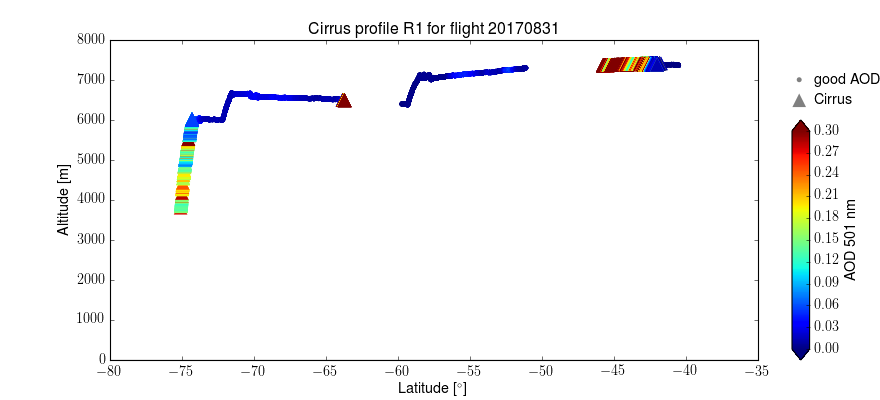

1


<IPython.core.display.Javascript object>


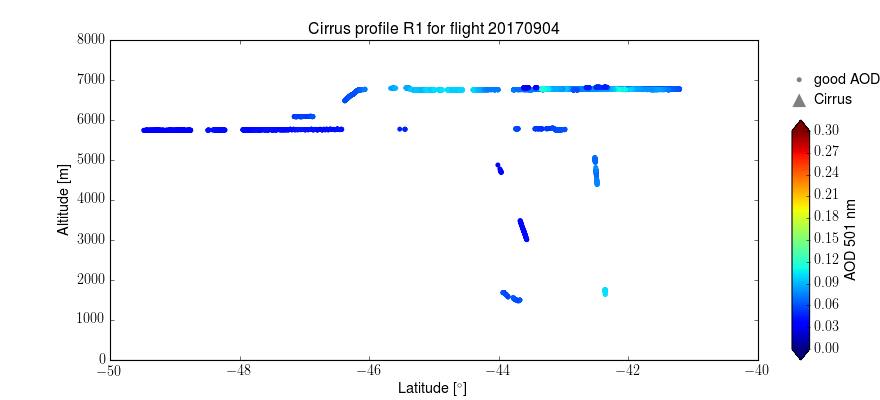

1


<IPython.core.display.Javascript object>


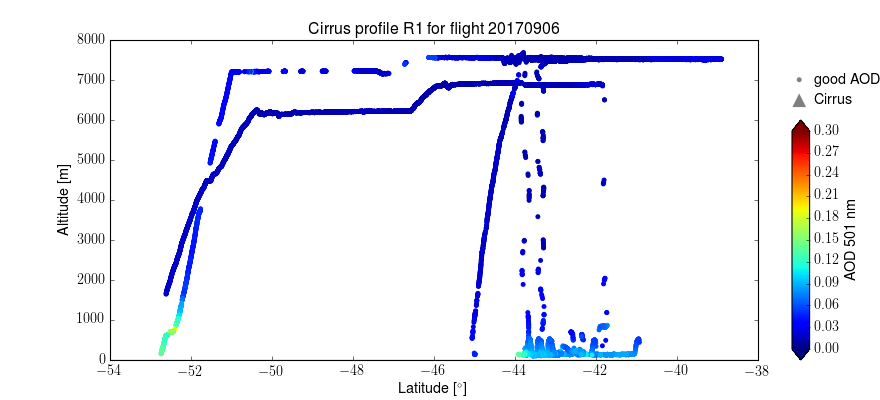

1


<IPython.core.display.Javascript object>


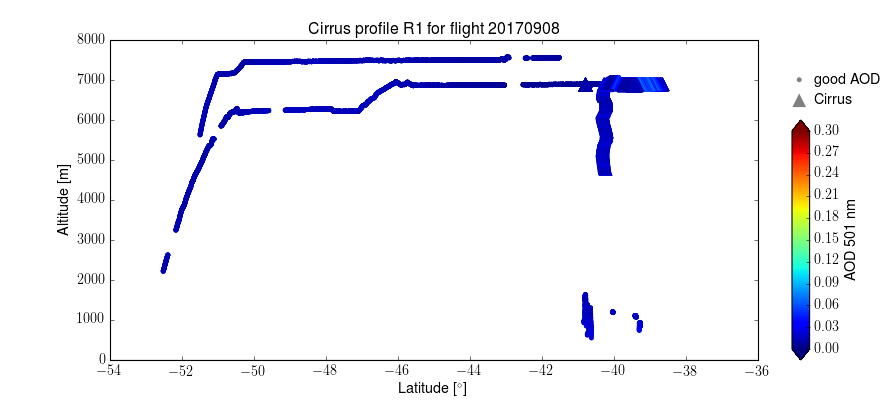

1


<IPython.core.display.Javascript object>


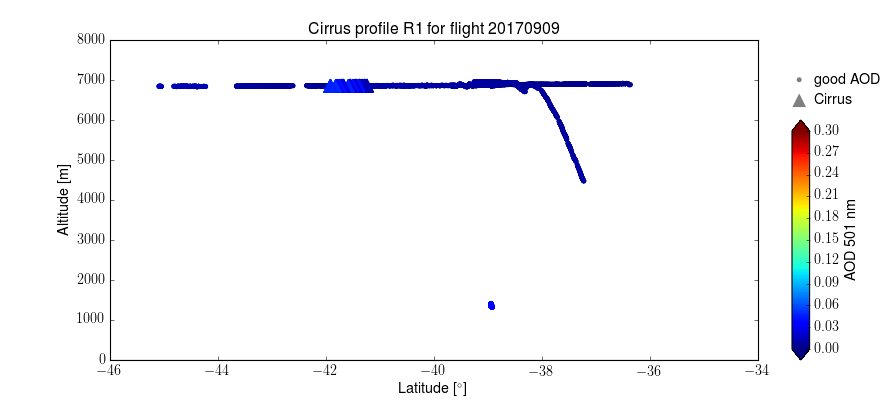

1


<IPython.core.display.Javascript object>


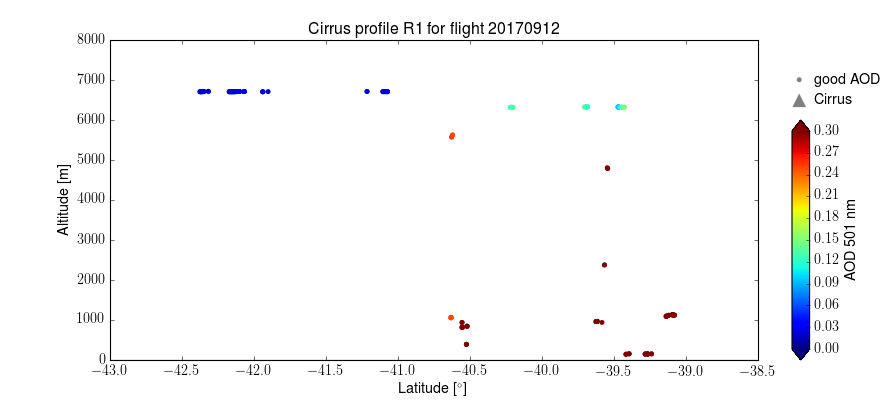

1


<IPython.core.display.Javascript object>


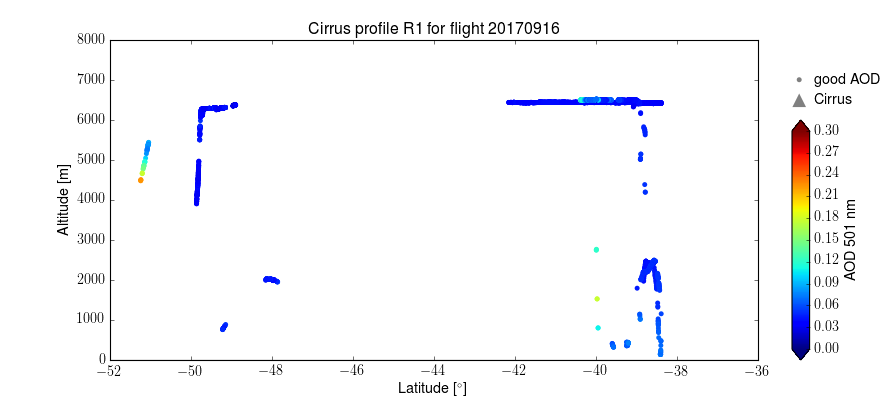

1


<IPython.core.display.Javascript object>


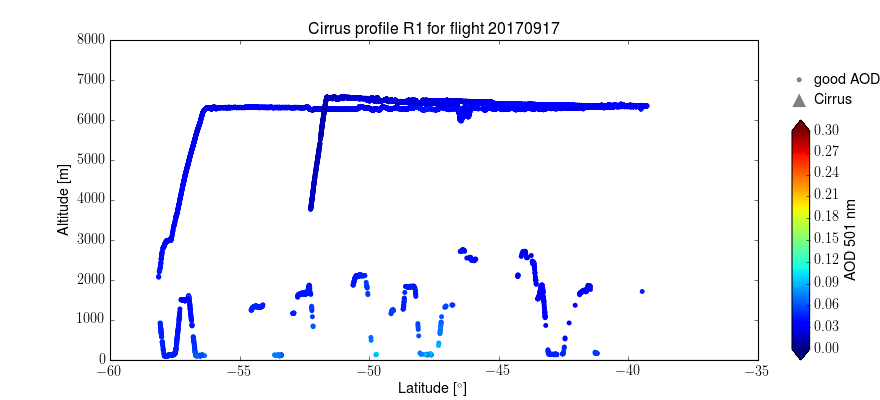

1


<IPython.core.display.Javascript object>


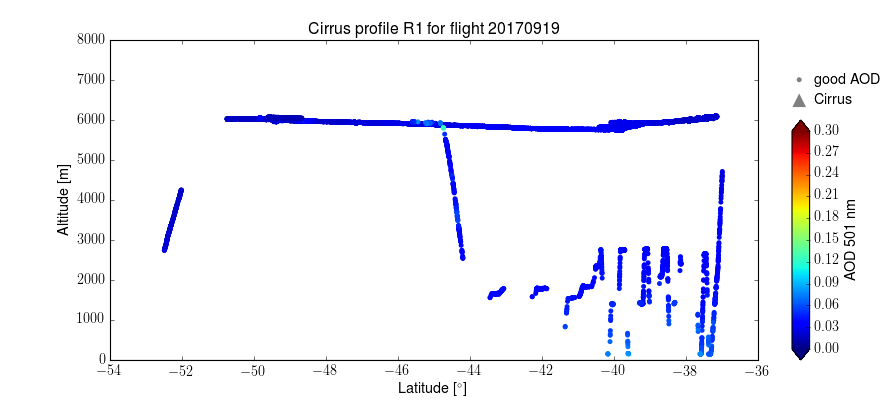

1


<IPython.core.display.Javascript object>


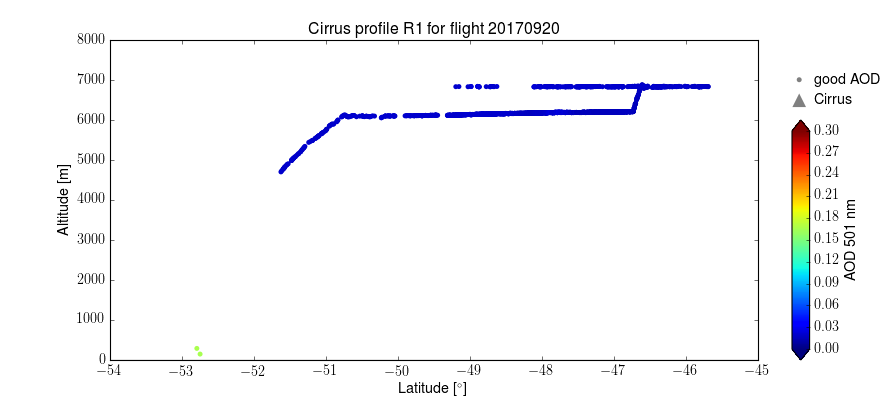

1


In [32]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(1,sharex=True,figsize=(11,5))
    ax.set_title('Cirrus profile {} for flight {}'.format(vv,d))
    qa = [outaod_RA[i]['qual_flag']==0]
    v = ax.scatter(outaod_RA[i]['Longitude'][qa],outaod_RA[i]['GPS_Alt'][qa],20,
                   c=outaod_RA[i]['AOD0501'][qa],marker='o',edgecolor='None',vmin=0.0,vmax=0.3)
    try:
        qaf = [(outaod_RA[i]['cirrus_flag']==1)]
        print len(qaf)
        v = ax.scatter(outaod_RA[i]['Longitude'][qaf],outaod_RA[i]['GPS_Alt'][qaf],150,
                   c=outaod_RA[i]['AOD0501'][qaf],marker='^',edgecolor='None',vmin=0.0,vmax=0.3)
    except:
        pass
    ax.set_ylabel('Altitude [m]')
    ax.set_ylim(0,8000)
    #ax.set_xlim(-23.5,-9.5)
    ax.axhline(0,color='k')
    ax.set_xlabel('Latitude [$^\\circ$]')
   
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.95, box.height])
    
    cbaxes = fig.add_axes([0.9, 0.1, 0.02, 0.6]) 
    cbar =  plt.colorbar(v,extend='both',cax=cbaxes)
    cbar.set_label('AOD 501 nm')
    
    sizes = [20,150]
    shape = ['o','^']
    labels = ['good AOD','Cirrus']
    points = [ax.scatter([], [], s=s, c='grey',marker=shape[iz],edgecolor='None') for iz,s in enumerate(sizes)]
    plt.legend(points, labels, scatterpoints=1,frameon=False,loc='upper left',bbox_to_anchor=(-1.15,1.25),handletextpad=0.02)
    plt.savefig(fp+'NAAMES3_aod_ict/{vi}/{vv}/{vv}_{}_lat_alt_cirrus.png'.format(d,vv=vv,vi=vi),dpi=600,transparent=True)

## Plot the AOD spectra, with the polyfit

In [179]:
np.shape(cc),len(outaod_RA[i]['Start_UTC']),len(ard['Start_UTC'][qa])

((20321, 4), 20321, 14390)

<IPython.core.display.Javascript object>


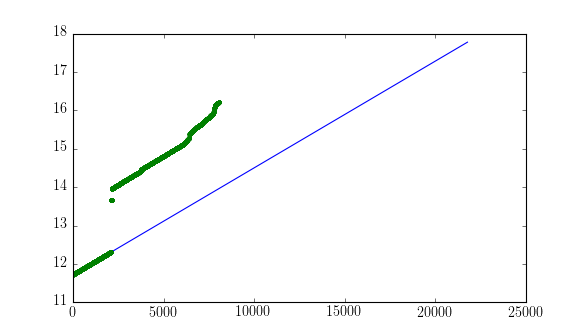

In [184]:
i=0
plt.figure()
plt.plot(outaod_RA[i]['Start_UTC'])
plt.plot(outaod_RA[i]['Start_UTC'][outaod_RA[i]['qual_flag']==0],'.')

<IPython.core.display.Javascript object>


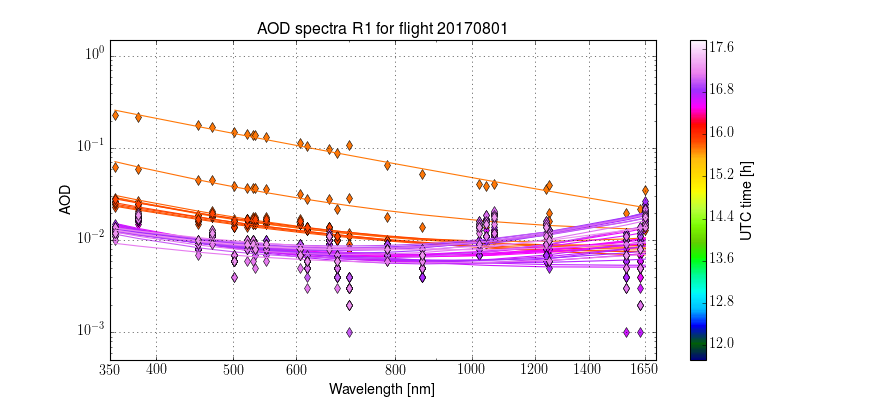

<IPython.core.display.Javascript object>


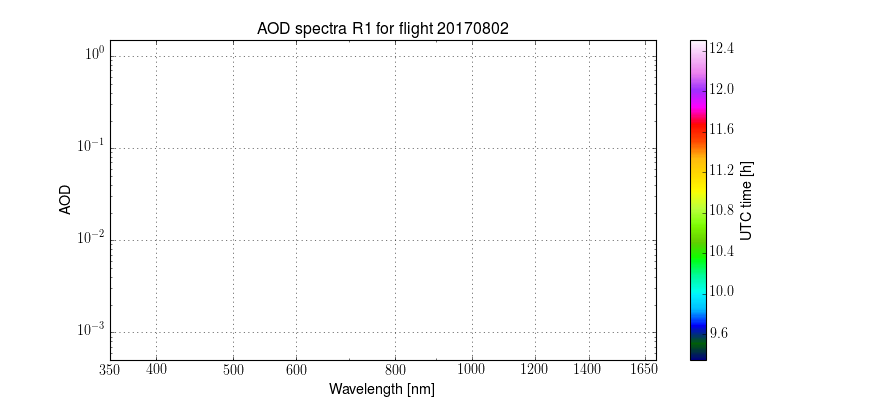

<IPython.core.display.Javascript object>


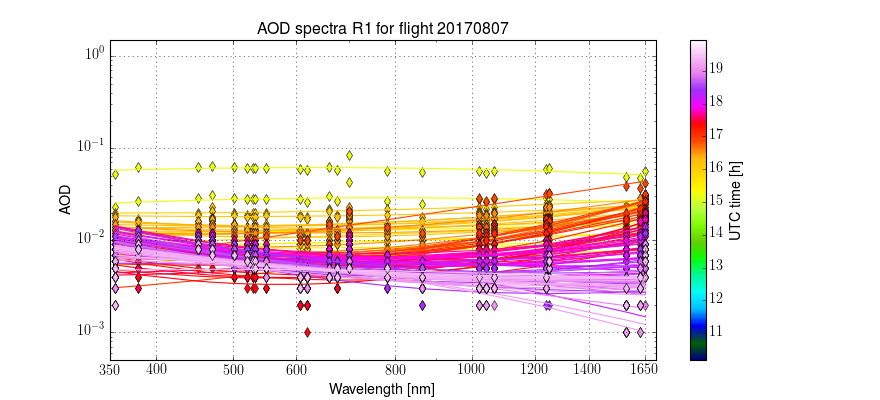

<IPython.core.display.Javascript object>


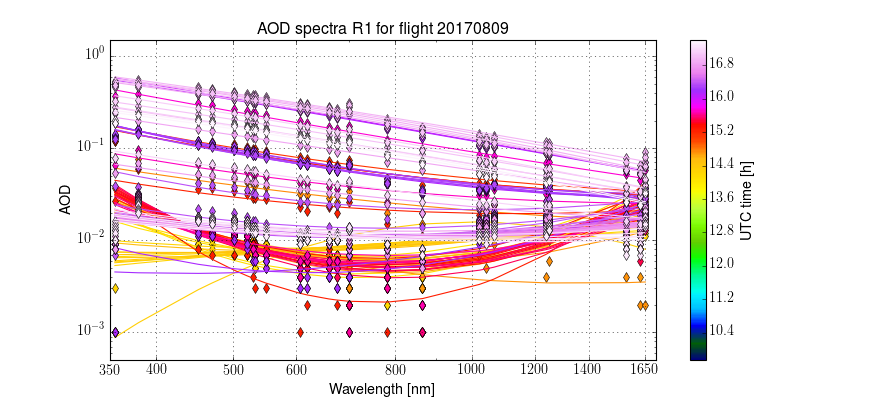

<IPython.core.display.Javascript object>


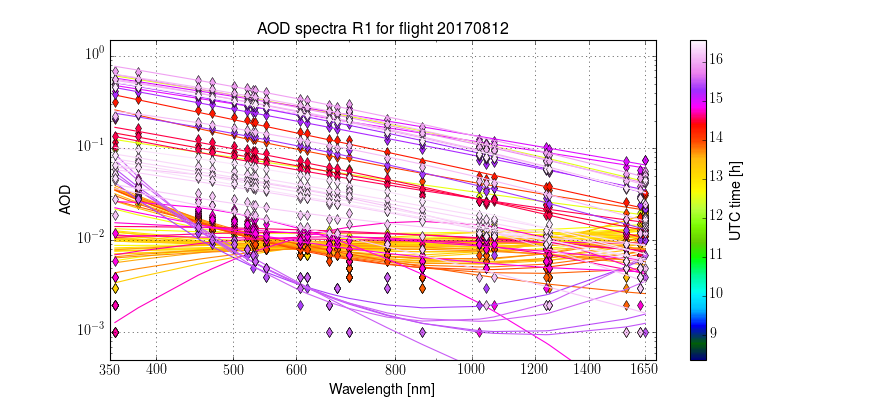

<IPython.core.display.Javascript object>


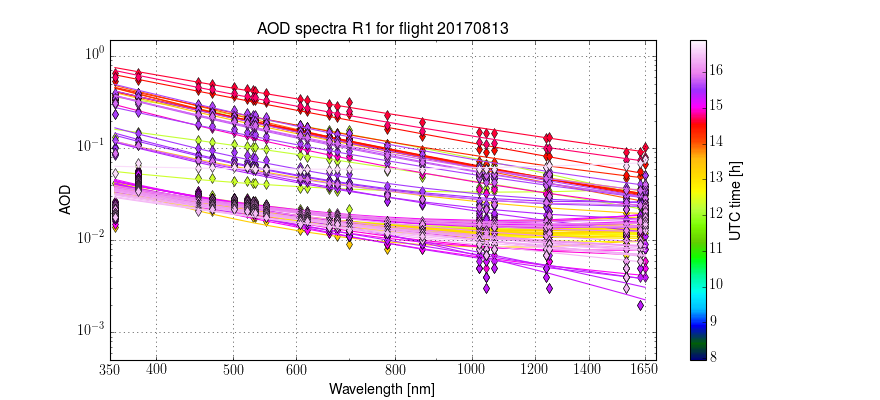

<IPython.core.display.Javascript object>


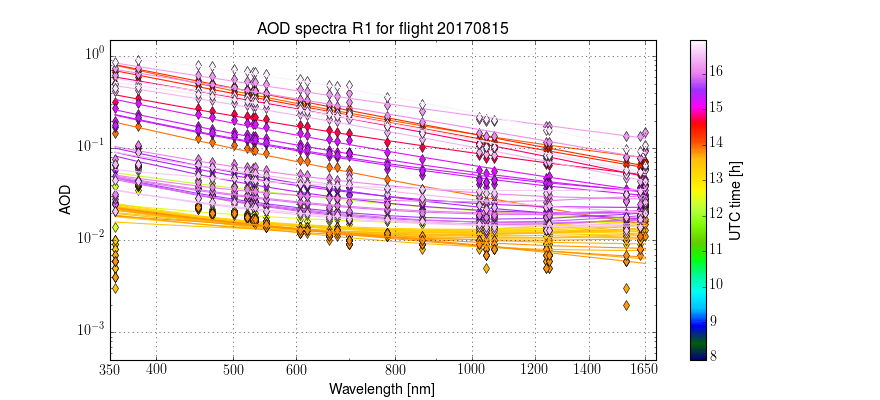

<IPython.core.display.Javascript object>


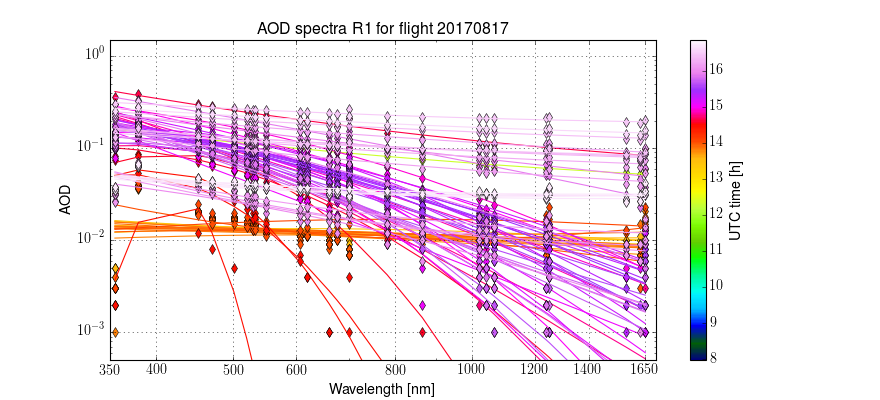

<IPython.core.display.Javascript object>


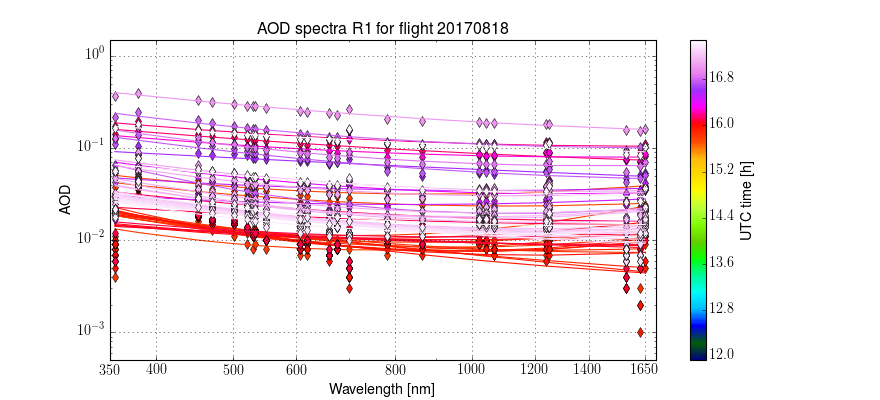

<IPython.core.display.Javascript object>


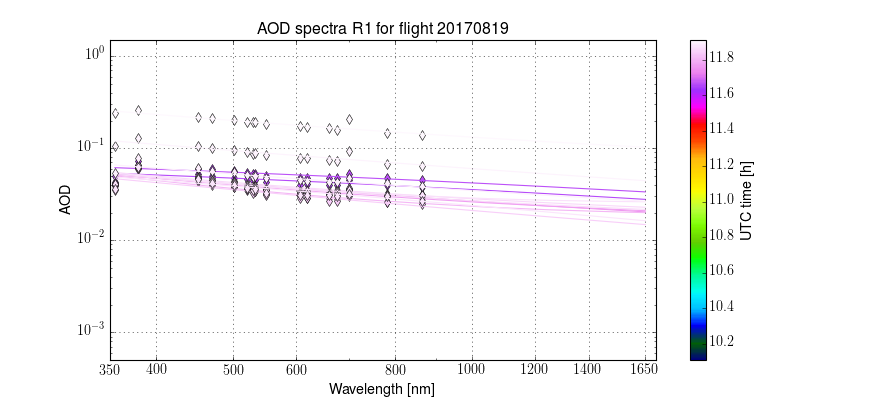

<IPython.core.display.Javascript object>


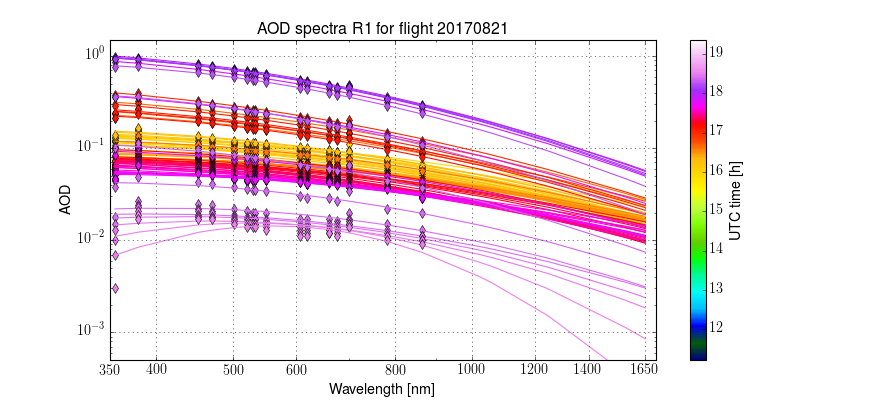

<IPython.core.display.Javascript object>


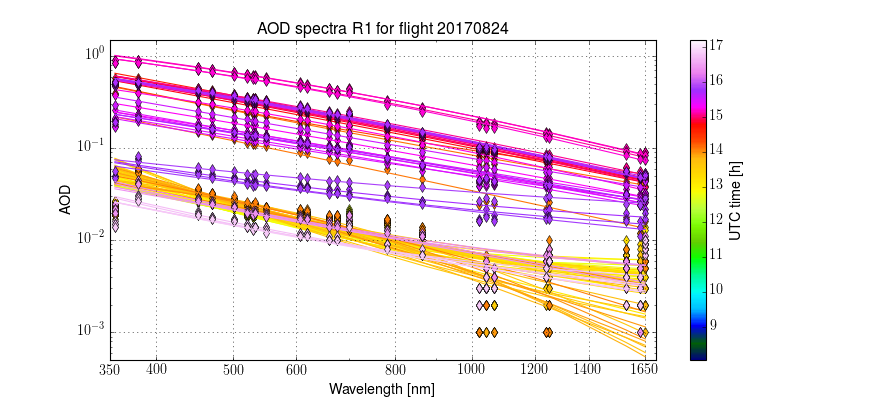

<IPython.core.display.Javascript object>


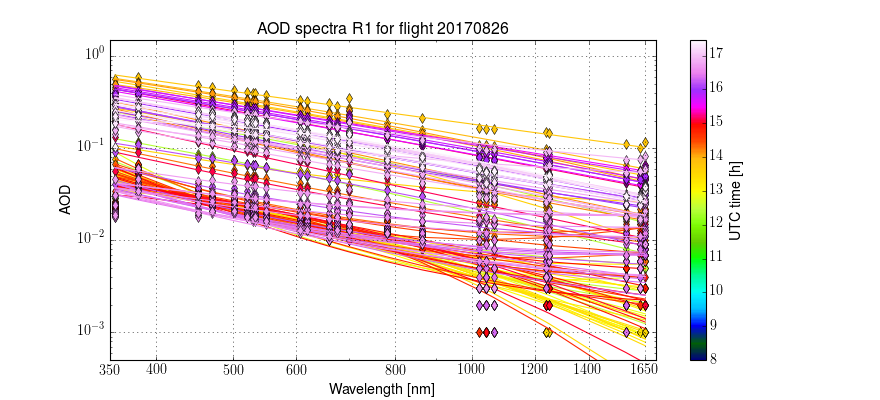

<IPython.core.display.Javascript object>


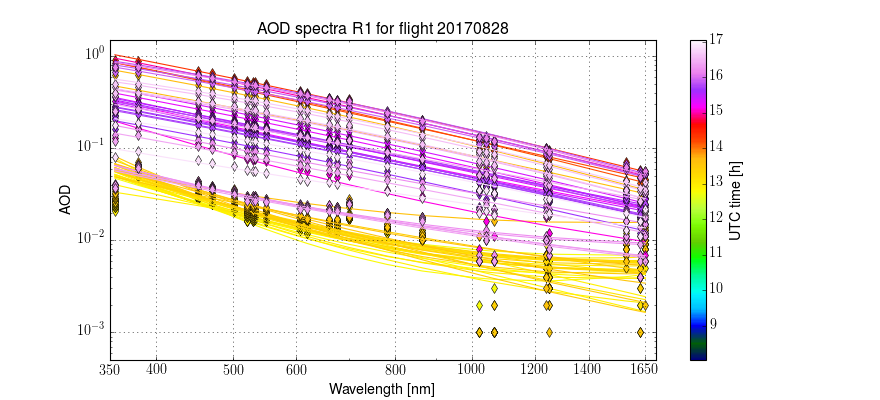

<IPython.core.display.Javascript object>


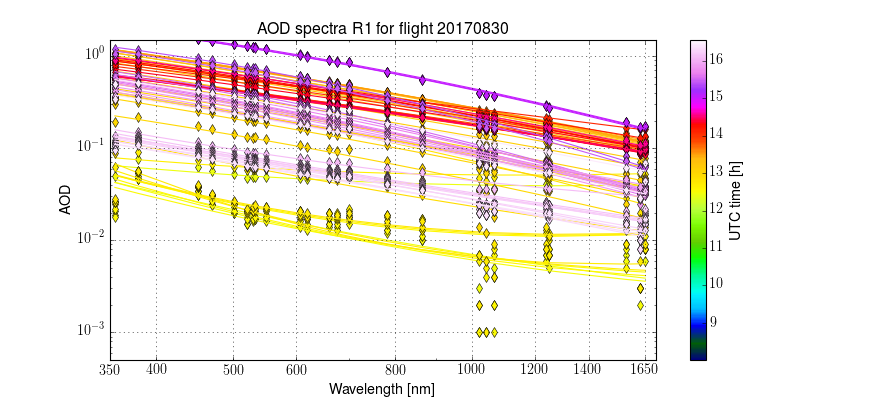

<IPython.core.display.Javascript object>


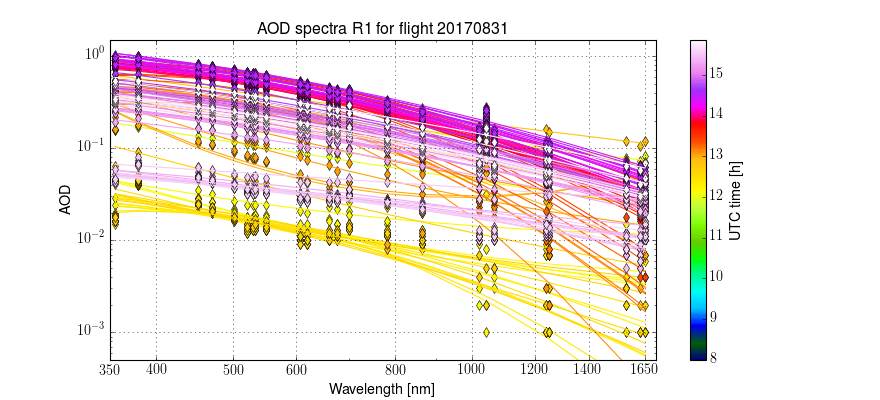

<IPython.core.display.Javascript object>


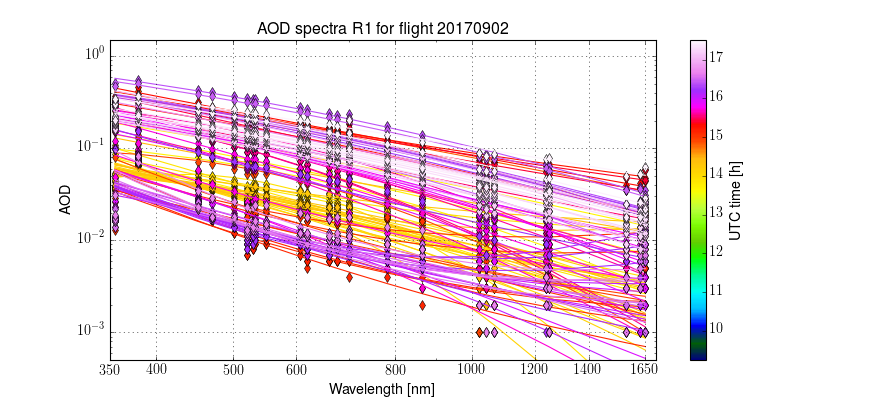

<IPython.core.display.Javascript object>


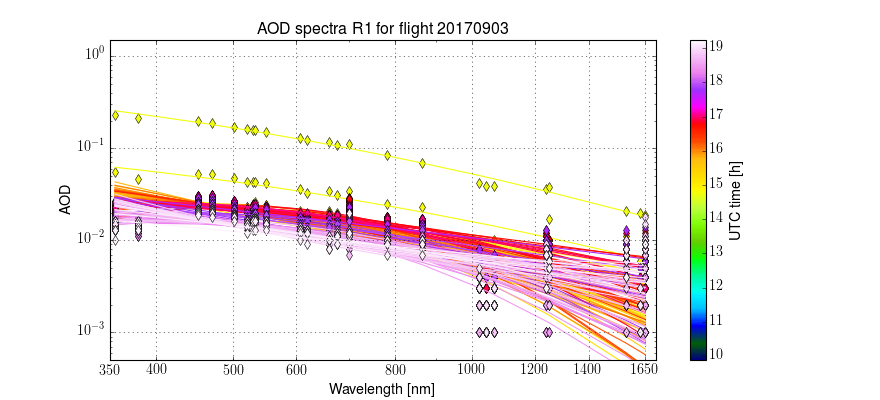

<IPython.core.display.Javascript object>


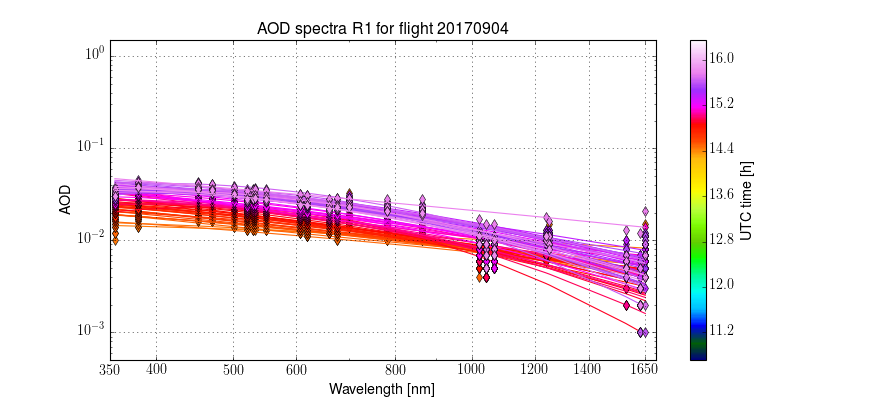

In [221]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(1,sharex=True,figsize=(11,5))
    ax.set_title('AOD spectra {} for flight {}'.format(vv,d))
    #bins = len(outaod_RA[i]['Start_UTC'])/10
    cc = plt.cm.gist_ncar(outaod_RA[i]['Start_UTC']/outaod_RA[i]['Start_UTC'].max())
    cmapname = 'gist_ncar'

    ard =  outaod_RA[i]
    asp = np.array([ard['AOD0355'],ard['AOD0380'],ard['AOD0452'],ard['AOD0470'],ard['AOD0501'],ard['AOD0520'],ard['AOD0530'],
                    ard['AOD0532'],ard['AOD0550'],ard['AOD0606'],ard['AOD0620'],ard['AOD0660'],ard['AOD0675'],ard['AOD0700'],
                    ard['AOD0781'],ard['AOD0865'],ard['AOD1020'],ard['AOD1040'],ard['AOD1064'],ard['AOD1236'],ard['AOD1250'],
                    ard['AOD1559'],ard['AOD1627'],ard['AOD1650']])
    qa = outaod_RA[i]['qual_flag']==0
    ax.plot([350],[1],'.',alpha=0.0)
    jj = 0
    for j,f in enumerate(ard['Start_UTC']):
        #if not np.isfinite(asp[:,j]).any(): continue
        if qa[j]: 
            jj = jj+1
            if jj%200>0: continue
            ax.plot(wv,asp[:,j],marker='d',linestyle='None',color=cc[j,:])
            ax.plot(wv,np.exp(np.polyval([ard['AOD_polycoef_a2'][j],ard['AOD_polycoef_a1'][j],ard['AOD_polycoef_a0'][j]],
                                         np.log(wv))),'-',c=cc[j,:])
    ax.set_ylim(0.0005,1.5)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_ylabel('AOD')
    ax.set_ylim(0.0005,1.5)
    ax.set_xlabel('Wavelength [nm]')
    ax.set_xlim(380.0,1700.0)
    plt.xticks([350,400,500,600,800,1000,1200,1400,1650])

    ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    ax.grid()

    scalarmap = plt.cm.ScalarMappable(cmap=plt.cm.get_cmap(cmapname))
    scalarmap.set_array(outaod_RA[i]['Start_UTC'][:0:-1])
    cba = plt.colorbar(scalarmap)
    cba.set_label('UTC time [h]')
    plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_spectra_polyfit_{vi}_{}.png'.format(d,vv=vv,vi=vi),dpi=600,transparent=True)

# Combine all the data in a single array

In [33]:
ar = {}
for n in nm:
    ar[n] = np.array([])

In [34]:
ar['days'] = np.array([])

In [35]:
for i,d in enumerate(days):
    ar['days'] = np.append(ar['days'],np.zeros_like(outaod_RA[i]['Start_UTC'])+i)
    for n in nm:
        try:
            ar[n] = np.append(ar[n],outaod_RA[i][n])
        except:
            print 'problem with :'+n
            ar[n] = np.append(ar[n],outaod_RA[i]['Start_UTC']*0)

In [36]:
ar['GPS_Alt'].shape

(344962,)

In [37]:
ar.keys()

['AOD1040',
 'AOD0520',
 'UNCAOD0620',
 'AOD0530',
 'UNCAOD0550',
 'AOD0470',
 'AOD0532',
 'cirrus_flag',
 'AOD0620',
 'AOD1064',
 'UNCAOD0452',
 'AOD0606',
 'Latitude',
 'AOD0550',
 'AOD0660',
 'AOD0452',
 'AOD0355',
 'UNCAOD0606',
 'UNCAOD1020',
 'UNCAOD0675',
 'UNCAOD0501',
 'UNCAOD0520',
 'qual_flag',
 'AOD_angstrom_470_865',
 'UNCAOD1250',
 'AOD0501',
 'Longitude',
 'AOD0865',
 'UNCAOD0660',
 'AOD1250',
 'UNCAOD0380',
 'UNCAOD1236',
 'AOD0675',
 'AOD1236',
 'UNCAOD0470',
 'AOD0380',
 'UNCAOD0865',
 'Start_UTC',
 'UNCAOD0781',
 'days',
 'AOD0781',
 'UNCAOD1064',
 'GPS_Alt',
 'amass_aer',
 'UNCAOD0355',
 'UNCAOD0532',
 'UNCAOD1040',
 'UNCAOD0530',
 'AOD1020']

## filter for low altitudes

In [258]:
ar['fl_alt'] = (ar['GPS_Alt']>600) & (ar['GPS_Alt']<1800)

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.
/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


In [259]:
ar['fl_alt_6'] = ar['GPS_Alt']<=600

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less_equal
  """Entry point for launching an IPython kernel.


In [260]:
ar['fl_alt_18'] = ar['GPS_Alt']>=1800

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater_equal
  """Entry point for launching an IPython kernel.


In [261]:
ar['fl_alt_22'] = (ar['GPS_Alt']<=2200) & (ar['GPS_Alt']>=800)

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less_equal
  """Entry point for launching an IPython kernel.
/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater_equal
  """Entry point for launching an IPython kernel.


In [262]:
ar['fl_QA'] = ar['qual_flag']==0

In [263]:
ar['fl'] = ar['fl_QA']&ar['fl_alt']

In [264]:
ar['fl1'] = ar['fl_QA']&ar['fl_alt_6']

In [265]:
ar['fl2'] = ar['fl_QA']&ar['fl_alt_18']

In [266]:
ar['fl3'] = ar['fl_QA'] & ar['fl_alt_22']

In [267]:
ar['fl_routine'] = (ar['days']==1.0)|(ar['days']==3.0)|(ar['days']==8.0)|(ar['days']==10.0)|(ar['days']==11.0)

In [268]:
ar['flr'] = ar['fl_routine'] & ar['fl_QA'] & ar['fl_alt']

In [269]:
ar['flac'] = (ar['flag_acaod']==1)&  ar['fl_QA']

In [270]:
ar['flacr'] = (ar['flag_acaod']==1)&  ar['fl_QA'] & ar['fl_routine']

## save to file

In [38]:
import hdf5storage as hs

In [ ]:
hs.savemat(fp+'/NAAMES3_aod_ict/all_aod_ict_{vv}_NAAMES3.mat'.format(vv=vv),ar)

## Optionally load the file

In [8]:
import hdf5storage as hs

In [9]:
ar = hs.loadmat(fp+'/aod_ict_2017/{vv}/all_aod_ict_{vv}_2017.mat'.format(vv=vv))

## Plot a histogram of all the AOD

In [10]:
from plotting_utils import prelim

In [ ]:
plt.figure()
plt.hist(ar['AOD0501'][ar['fl']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='g',label='600-1800 m')
plt.hist(ar['AOD0501'][ar['fl1']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='b',label='below 600 m')
plt.hist(ar['AOD0501'][ar['flacr']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='y',label='Routine only')
plt.hist(ar['AOD0501'][ar['flac']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='r',label='ACAOD')
#plt.hist(ar['AOD0501'][ar['fl2']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='r',label='above 1800 m')
#plt.yscale('log')
plt.axvline(x=np.nanmean(ar['AOD0501'][ar['fl']]),ls='-',color='g',lw=2.5,label='Mean')
plt.axvline(x=np.nanmedian(ar['AOD0501'][ar['fl']]),ls='--',color='grey',label='Median')

plt.axvline(x=np.nanmean(ar['AOD0501'][ar['flacr']]),ls='-',color='y',lw=2.5)
plt.axvline(x=np.nanmedian(ar['AOD0501'][ar['flacr']]),ls='--',color='darkkhaki')

plt.axvline(x=np.nanmean(ar['AOD0501'][ar['flac']]),ls='-',color='b',lw=2.5,label='Mean')
plt.axvline(x=np.nanmedian(ar['AOD0501'][ar['flac']]),ls='--',color='lightblue',label='Median') 

plt.xlabel('AOD at 501 nm')
plt.ylabel('Counts')
plt.grid()
plt.title('Above clouds AOD distribution cloud filtered for 2017')
#prelim()
plt.legend(frameon=False)
#plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_histogram.png'.format(vv=vv),dpi=600,transparent=True)

In [274]:
np.nanmean(ar['AOD0501'][ar['flacr']])

0.35036753445635538

In [275]:
lim = np.linspace(-15,7,12)
pos = np.array([(l+lim[i+1])/2.0 for i,l in enumerate(lim[0:-1])])

<IPython.core.display.Javascript object>


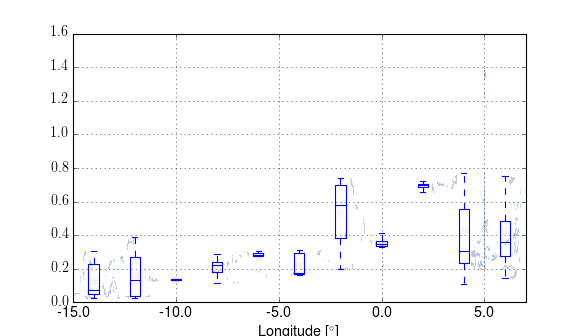

In [277]:
plt.figure()
plt.plot(ar['Longitude'][ar['flac']],ar['AOD0501'][ar['flac']],'.',color='lightsteelblue',alpha=0.5,markersize=0.4,label='All data')
plt.xlim([-15,7])
make_boxplot(ar['AOD0501'][ar['flac']],ar['Longitude'][ar['flac']],lim,pos,color='blue',label='Statistics',fliers_off=True)
plt.xlabel('Longitude [$^\\circ$]')
plt.ylabel('4STAR AOD at 501 nm Above cloud')
plt.grid()
plt.xlim([-15,7])
plt.legend(frameon=False,numpoints=1,loc=2)
#prelim()

plt.title('ORACLES 2017 above cloud AOD')
#plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_longitude.png'.format(vv=vv),dpi=600,transparent=True)

In [ ]:
lima = np.linspace(-15,0,11)
posa = np.array([(l+lima[i+1])/2.0 for i,l in enumerate(lima[0:-1])])
plt.figure()
plt.plot(ar['Latitude'][ar['flac']],ar['AOD0501'][ar['flac']],'.',color='lightsteelblue',alpha=0.5,markersize=0.4,label='All data')
plt.xlim([-15,1])
make_boxplot(ar['AOD0501'][ar['flac']],ar['Latitude'][ar['flac']],lima,posa,color='blue',label='Statistics',fliers_off=True)

plt.plot(ar['Latitude'][ar['flacr']],ar['AOD0501'][ar['flacr']],'.',color='lightyellow',alpha=0.5,markersize=0.4,
         label='Routine flights')
plt.xlim([-15,1])
make_boxplot(ar['AOD0501'][ar['flacr']],ar['Latitude'][ar['flacr']],lima,posa,color='yellow',label='Statistics for routine',
             fliers_off=True)

plt.xlabel('Latitude [$^\\circ$]')
plt.ylabel('4STAR AOD at 501 nm above cloud')
plt.grid()
plt.xlim([-15,1])
plt.legend(frameon=False,numpoints=1,loc=1)
#prelim()

plt.title('ORACLES 2017 above cloud AOD')
plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_latitude.png'.format(vv=vv),dpi=600,transparent=True)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


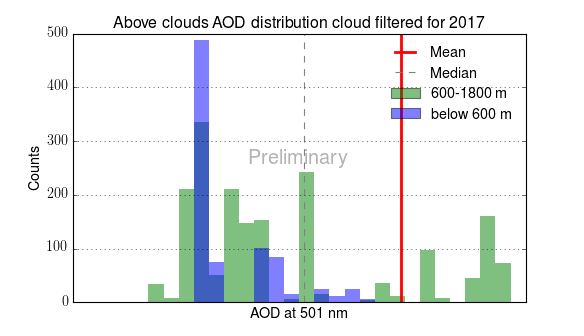

In [155]:
plt.figure()
plt.hist(ar['AOD0501'][ar['fl']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='g',label='600-1800 m')
plt.hist(ar['AOD0501'][ar['fl1']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='b',label='below 600 m')
#plt.hist(ar['AOD0501'][ar['fl2']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='r',label='above 1800 m')
#plt.yscale('log')
plt.axvline(x=np.nanmean(ar['AOD0501'][ar['fl']]),ls='-',color='r',lw=2.5,label='Mean')
plt.axvline(x=np.nanmedian(ar['AOD0501'][ar['fl']]),ls='--',color='grey',label='Median')
plt.xlabel('AOD at 501 nm')
plt.ylabel('Counts')
plt.grid()
plt.xticks([])
plt.title('Above clouds AOD distribution cloud filtered for 2017')
prelim()
plt.legend(frameon=False)
plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_histogram_nox.png'.format(vv=vv),dpi=600,transparent=True)

In [45]:
np.nanmean(ar['AOD0501'][ar['fl']])

0.29491046837902007

<IPython.core.display.Javascript object>


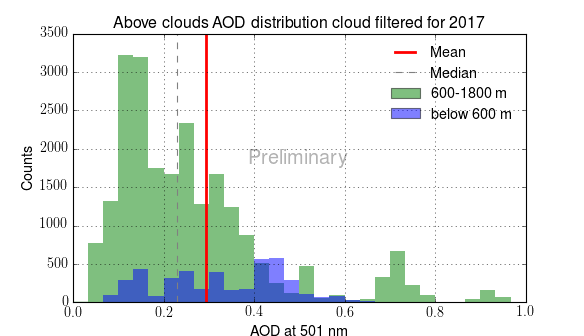

In [46]:
plt.figure()
plt.hist(ar['AOD0501'][ar['fl']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='g',label='600-1800 m')
plt.hist(ar['AOD0501'][ar['fl1']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='b',label='below 600 m')
#plt.hist(ar['AOD0501'][ar['fl2']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='r',label='above 1800 m')
#plt.yscale('log')
plt.axvline(x=np.nanmean(ar['AOD0501'][ar['fl']]),ls='-',color='r',lw=2.5,label='Mean')
plt.axvline(x=np.nanmedian(ar['AOD0501'][ar['fl']]),ls='--',color='grey',label='Median')
plt.xlabel('AOD at 501 nm')
plt.ylabel('Counts')
plt.grid()
plt.title('Above clouds AOD distribution cloud filtered for 2017')
prelim()
plt.legend(frameon=False)
plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_histogram.png'.format(vv=vv),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


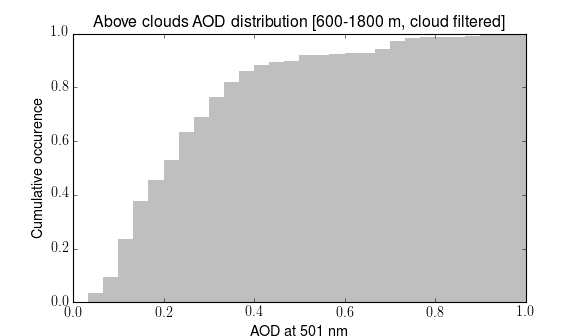

In [47]:
plt.figure()
plt.hist(ar['AOD0501'][ar['fl']],bins=30,range=(0,1.0),alpha=0.5,normed=True,edgecolor='None',color='grey',cumulative=True)
plt.xlabel('AOD at 501 nm')
plt.ylabel('Cumulative occurence')
plt.title('Above clouds AOD distribution [600-1800 m, cloud filtered]')
plt.savefig(fp+'aod_ict/{vv}_AOD_histogram_cum.png'.format(vv=vv),dpi=600,transparent=True)

In [10]:
np.nanmean(ar['AOD0501'][ar['fl']])

0.30270054350046993

In [11]:
np.nanmedian(ar['AOD0501'][ar['fl']])

0.23599999999999999

In [12]:
np.nanstd(ar['AOD0501'][ar['fl']])

0.25914230830982199

## Make a histogram of the airmass

In [156]:
ar.keys()

['AOD1040',
 'AOD0532',
 'UNCAOD0620',
 'AOD0530',
 'UNCAOD0550',
 'UNCAOD0700',
 'AOD0470',
 'AOD1627',
 'UNCAOD0606',
 'AOD0606',
 'AOD1064',
 'Latitude',
 'fl_alt',
 'UNCAOD0452',
 'fl_alt_6',
 'AOD0620',
 'AOD0700',
 'AOD0550',
 'AOD0660',
 'AOD0452',
 'AOD0355',
 'fl1',
 'fl',
 'UNCAOD1020',
 'UNCAOD0675',
 'fl_alt_18',
 'UNCAOD0501',
 'UNCAOD0520',
 'qual_flag',
 'AOD0520',
 'AOD1559',
 'UNCAOD1650',
 'UNCAOD1250',
 'AOD0501',
 'fl2',
 'Longitude',
 'UNCAOD0660',
 'AOD1250',
 'UNCAOD0380',
 'AOD1650',
 'UNCAOD1236',
 'AOD0675',
 'fl_QA',
 'AOD1236',
 'UNCAOD0470',
 'AOD0380',
 'UNCAOD0865',
 'Start_UTC',
 'UNCAOD0781',
 'days',
 'AOD0781',
 'UNCAOD1064',
 'UNCAOD1559',
 'AOD1020',
 'AOD0865',
 'amass_aer',
 'UNCAOD1627',
 'UNCAOD0355',
 'UNCAOD0532',
 'UNCAOD1040',
 'UNCAOD0530',
 'GPS_Alt']

<IPython.core.display.Javascript object>


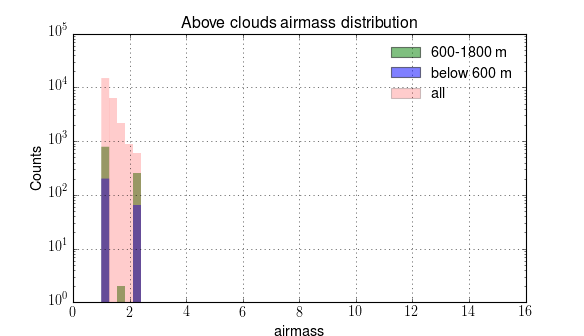

C:\Python27_64\WinPython-64bit-2.7.6.4\python-2.7.6.amd64\lib\site-packages\numpy\lib\function_base.py:229: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= mn)
C:\Python27_64\WinPython-64bit-2.7.6.4\python-2.7.6.amd64\lib\site-packages\numpy\lib\function_base.py:230: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= mx)


In [52]:
plt.figure()
plt.hist(ar['amass_aer'][ar['fl']],bins=50,range=(1.0,15.0),alpha=0.5,normed=False,edgecolor='None',color='g',label='600-1800 m')
plt.hist(ar['amass_aer'][ar['fl1']],bins=50,range=(1.0,15.0),alpha=0.5,normed=False,edgecolor='None',color='b',label='below 600 m')
plt.hist(ar['amass_aer'],bins=50,range=(1.0,15.0),alpha=0.2,normed=False,edgecolor='None',color='r',label='all')
#plt.hist(ar['AOD0501'][ar['fl2']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='r',label='above 1800 m')
#plt.yscale('log')
plt.xlabel('airmass')
plt.ylabel('Counts')
plt.grid()
plt.title('Above clouds airmass distribution')
plt.legend(frameon=False)
plt.gca().set_yscale('log')
plt.savefig(fp+'aod_ict/{vv}/{vv}_Airmass_histogram.png'.format(vv=vv),dpi=600,transparent=True)

## Make histogram and compare to 2016

### Load 2016

In [11]:
ar_1 = hs.loadmat(fp+'/aod_ict/R2/all_aod_ict_R2.mat')

In [12]:
ar_1.keys()

[u'AOD1040',
 u'AOD0532',
 u'AOD0530',
 u'UNCAOD0550',
 u'UNCAOD0700',
 u'AOD0470',
 u'AOD1627',
 u'AOD0520',
 u'UNCAOD0620',
 u'AOD0606',
 u'AOD1064',
 u'Latitude',
 u'UNCAOD0452',
 u'fl_alt_6',
 u'AOD0620',
 u'AOD0700',
 u'AOD0550',
 u'AOD0660',
 u'AOD0452',
 u'AOD0355',
 u'fl1',
 u'UNCAOD1236',
 u'fl2',
 u'UNCAOD1064',
 u'UNCAOD0501',
 u'UNCAOD0606',
 u'UNCAOD0355',
 u'qual_flag',
 u'UNCAOD0675',
 u'AOD1559',
 u'UNCAOD1650',
 u'UNCAOD1559',
 u'UNCAOD1250',
 u'AOD0501',
 u'Longitude',
 u'UNCAOD0660',
 u'GPS_Alt',
 u'AOD1250',
 u'UNCAOD0380',
 u'fl',
 u'AOD0675',
 u'fl_QA',
 u'AOD1236',
 u'AOD1650',
 u'UNCAOD0470',
 u'AOD0380',
 u'UNCAOD0865',
 u'idays',
 u'Start_UTC',
 u'UNCAOD0781',
 u'days',
 u'UNCAOD0520',
 u'AOD0781',
 u'fl_alt_18',
 u'fl_alt',
 u'AOD0865',
 u'amass_aer',
 u'UNCAOD1627',
 u'UNCAOD1020',
 u'UNCAOD0532',
 u'UNCAOD1040',
 u'UNCAOD0530',
 u'AOD1020']

In [13]:
days_1 = ['20160824','20160825','20160827','20160830','20160831','20160902','20160904','20160906','20160908',
       '20160910','20160912','20160914','20160918','20160920','20160924','20160925','20160927','20160930']

In [14]:
#routine days
rd = [20160831.0,20160904.0,20160908.0,20160910.0,20160912.0,20160925.0]

In [15]:
ar_1['days']

array([ 20160824.,  20160824.,  20160824., ...,  20160930.,  20160930.,
        20160930.])

In [16]:
flr1 = ((ar_1['days']==rd[0]) | (ar_1['days']==rd[1]) | (ar_1['days']==rd[2]) | (ar_1['days']==rd[3]) | (ar_1['days']==rd[4]) | (ar_1['days']==rd[5]))

In [17]:
#flr1 = ((ar_1['days']==4) | (ar_1['days']==6) | (ar_1['days']==8) | (ar_1['days']==9) | (ar_1['days']==10) | (ar_1['days']==15))

In [18]:
ar_1['flr'] = flr1&ar_1['fl_QA']&ar_1['fl_alt']

### Plot the histogram comparisons

In [19]:
len(ar['AOD0501'][ar['fl']]), len(ar_1['AOD0501'][ar_1['fl']])

(24471, 38260)

In [20]:
np.nanmean(ar['AOD0501'][ar['fl']]),np.nanmean(ar_1['AOD0501'][ar_1['fl']])

(0.30270054350046993, 0.33456740721380029)

<IPython.core.display.Javascript object>


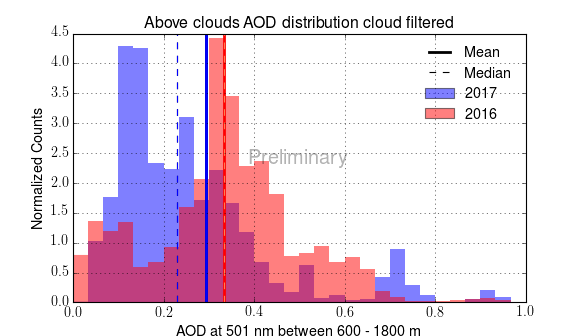

In [152]:
plt.figure()
plt.hist(ar['AOD0501'][ar['fl']],bins=30,range=(0,1.0),alpha=0.5,normed=True,edgecolor='None',color='b',label='2017')
plt.hist(ar_1['AOD0501'][ar_1['fl']],bins=30,range=(0,1.0),alpha=0.5,normed=True,edgecolor='None',color='r',label='2016')
#plt.hist(ar['AOD0501'][ar['fl1']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='b',label='below 600 m')
#plt.hist(ar['AOD0501'][ar['fl3']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='y',label='800-2200 m')
#plt.hist(ar['AOD0501'][ar['fl2']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='r',label='above 1800 m')
#plt.yscale('log')
plt.axvline(x=np.nanmean(ar['AOD0501'][ar['fl']]),ls='-',color='k',lw=2.5,label='Mean')
plt.axvline(x=np.nanmedian(ar['AOD0501'][ar['fl']]),ls='--',color='k',label='Median')
plt.axvline(x=np.nanmean(ar['AOD0501'][ar['fl']]),ls='-',color='b',lw=2.5)
plt.axvline(x=np.nanmedian(ar['AOD0501'][ar['fl']]),ls='--',color='b')

plt.axvline(x=np.nanmean(ar_1['AOD0501'][ar_1['fl']]),ls='-',color='r',lw=2.5)
plt.axvline(x=np.nanmedian(ar_1['AOD0501'][ar_1['fl']]),ls='--',color='coral')

plt.xlabel('AOD at 501 nm between 600 - 1800 m')
plt.ylabel('Normalized Counts')
plt.grid()
plt.title('Above clouds AOD distribution cloud filtered')
prelim()
plt.legend(frameon=False)
plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_normed_histogram_2017_vs_2016.png'.format(vv=vv),dpi=600,transparent=True)

In [153]:
ar.keys()

['AOD1040',
 'AOD0532',
 'UNCAOD0620',
 'AOD0530',
 'UNCAOD0550',
 'UNCAOD0700',
 'AOD0470',
 'AOD1627',
 'UNCAOD0606',
 'AOD0606',
 'AOD1064',
 'Latitude',
 'fl_alt',
 'UNCAOD0452',
 'fl_alt_6',
 'AOD0620',
 'AOD0700',
 'AOD0550',
 'AOD0660',
 'AOD0452',
 'AOD0355',
 'fl1',
 'fl',
 'fl3',
 'UNCAOD1020',
 'UNCAOD0675',
 'fl_alt_18',
 'UNCAOD0501',
 'UNCAOD0520',
 'qual_flag',
 'AOD0520',
 'AOD1559',
 'UNCAOD1650',
 'UNCAOD1250',
 'AOD0501',
 'fl2',
 'Longitude',
 'UNCAOD0660',
 'AOD1250',
 'UNCAOD0380',
 'AOD1650',
 'UNCAOD1236',
 'AOD0675',
 'fl_QA',
 'AOD1236',
 'UNCAOD0470',
 'AOD0380',
 'UNCAOD0865',
 'Start_UTC',
 'UNCAOD0781',
 'days',
 'fl_alt_22',
 'AOD0781',
 'UNCAOD1064',
 'UNCAOD1559',
 'AOD1020',
 'AOD0865',
 'amass_aer',
 'UNCAOD1627',
 'UNCAOD0355',
 'UNCAOD0532',
 'UNCAOD1040',
 'UNCAOD0530',
 'GPS_Alt']

<IPython.core.display.Javascript object>


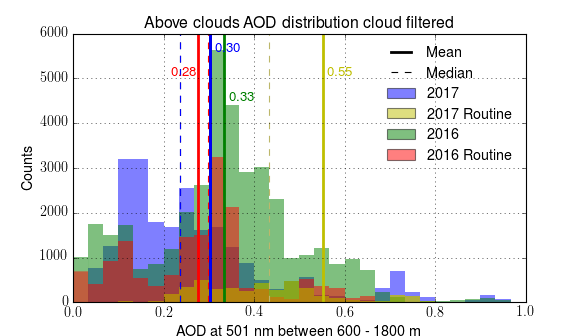

In [41]:
plt.figure()
plt.hist(ar['AOD0501'][ar['fl']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='b',label='2017')
plt.hist(ar['AOD0501'][ar['flr']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='y',label='2017 Routine')

plt.hist(ar_1['AOD0501'][ar_1['fl']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='g',label='2016')
plt.hist(ar_1['AOD0501'][ar_1['flr']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='r',label='2016 Routine')
plt.hist(ar['AOD0501'][ar['flr']],bins=30,range=(0,1.0),alpha=0.5,normed=False,edgecolor='None',color='y')

plt.axvline(x=np.nanmean(ar['AOD0501'][ar['flr']]),ls='-',color='y',lw=2.5)
plt.axvline(x=np.nanmedian(ar['AOD0501'][ar['flr']]),ls='--',color='darkkhaki')

plt.axvline(x=np.nanmean(ar['AOD0501'][ar['fl']]),ls='-',color='k',lw=2.5,label='Mean')
plt.axvline(x=np.nanmedian(ar['AOD0501'][ar['fl']]),ls='--',color='k',label='Median')
plt.axvline(x=np.nanmean(ar['AOD0501'][ar['fl']]),ls='-',color='b',lw=2.5)
plt.axvline(x=np.nanmedian(ar['AOD0501'][ar['fl']]),ls='--',color='b')

plt.axvline(x=np.nanmean(ar_1['AOD0501'][ar_1['fl']]),ls='-',color='g',lw=2.5)
plt.axvline(x=np.nanmedian(ar_1['AOD0501'][ar_1['fl']]),ls='--',color='g')

plt.axvline(x=np.nanmean(ar_1['AOD0501'][ar_1['flr']]),ls='-',color='r',lw=2.5)
plt.axvline(x=np.nanmedian(ar_1['AOD0501'][ar_1['flr']]),ls='--',color='r')

plt.text(np.nanmean(ar['AOD0501'][ar['flr']])+0.01,5050,'{:0.2f}'.format(np.nanmean(ar['AOD0501'][ar['flr']])),color='y')
plt.text(np.nanmean(ar['AOD0501'][ar['fl']])+0.01,5600,'{:0.2f}'.format(np.nanmean(ar['AOD0501'][ar['fl']])),color='b')
plt.text(np.nanmean(ar_1['AOD0501'][ar_1['fl']])+0.01,4500,'{:0.2f}'.format(np.nanmean(ar_1['AOD0501'][ar_1['fl']])),color='g')
plt.text(np.nanmean(ar_1['AOD0501'][ar_1['flr']])-0.06,5050,'{:0.2f}'.format(np.nanmean(ar_1['AOD0501'][ar_1['flr']])),color='r')

plt.xlabel('AOD at 501 nm between 600 - 1800 m')
plt.ylabel('Counts')
plt.grid()
plt.title('Above clouds AOD distribution cloud filtered')
#prelim()
plt.legend(frameon=False)
plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_histogram_2017_vs_2016_withroutine.png'.format(vv=vv),dpi=600,transparent=True)

### Plot the longitudinal dependence of 2017 vs 2016

In [21]:
lim2 = np.linspace(-15,15,16)
pos2 = np.array([(l+lim2[i+1])/2.0 for i,l in enumerate(lim2[0:-1])])

<IPython.core.display.Javascript object>


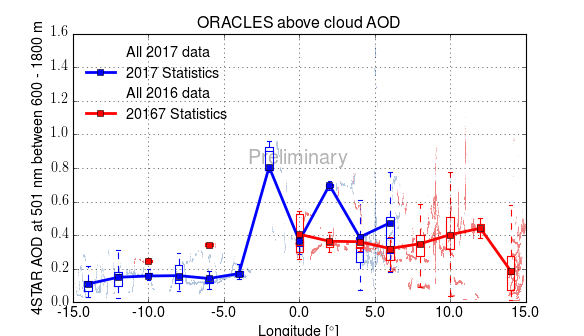

In [24]:
plt.figure()
plt.plot(ar['Longitude'][ar['fl']],ar['AOD0501'][ar['fl']],'.',color='lightsteelblue',alpha=0.5,
         markersize=0.4,label='All 2017 data')
plt.xlim([-15,15])
make_boxplot(ar['AOD0501'][ar['fl']],ar['Longitude'][ar['fl']],lim,pos,color='blue',label='2017 Statistics',fliers_off=True)
plt.plot(ar_1['Longitude'][ar_1['fl']],ar_1['AOD0501'][ar_1['fl']],'.',color='lightcoral',alpha=0.5,
         markersize=0.4,label='All 2016 data')
make_boxplot(ar_1['AOD0501'][ar_1['fl']],ar_1['Longitude'][ar_1['fl']],lim2,pos2,color='red',
             label='20167 Statistics',fliers_off=True)

plt.xlabel('Longitude [$^\\circ$]')
plt.ylabel('4STAR AOD at 501 nm between 600 - 1800 m')
plt.grid()
plt.xlim([-15,15])
plt.legend(frameon=False,numpoints=1,loc=2)
prelim()

plt.title('ORACLES above cloud AOD')
plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_longitude_2016_vs_2017.png'.format(vv=vv),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


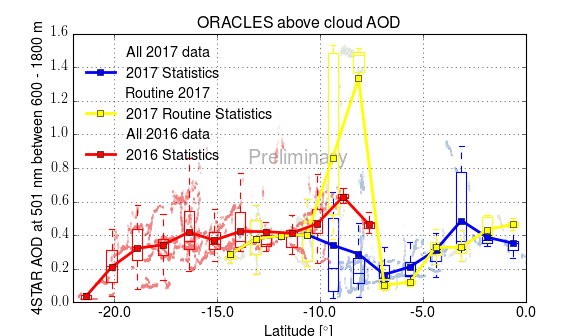

In [210]:
lima = np.linspace(-15,0,13)
posa = np.array([(l+lima[i+1])/2.0 for i,l in enumerate(lima[0:-1])])
plt.figure()
plt.plot(ar['Latitude'][ar['fl']],ar['AOD0501'][ar['fl']],'.',color='lightsteelblue',alpha=0.5,
         markersize=0.4,label='All 2017 data')
plt.xlim([-22,0])
make_boxplot(ar['AOD0501'][ar['fl']],ar['Latitude'][ar['fl']],lima,posa,color='blue',label='2017 Statistics',fliers_off=True)
plt.plot(ar['Latitude'][ar['flr']],ar['AOD0501'][ar['flr']],'.',color='lightyellow',alpha=0.5,
         markersize=0.4,label='Routine 2017')
make_boxplot(ar['AOD0501'][ar['flr']],ar['Latitude'][ar['flr']],lima,posa,color='yellow',label='2017 Routine Statistics',
             fliers_off=True)


lim2a = np.linspace(-22,-7,13)
pos2a = np.array([(l+lim2a[i+1])/2.0 for i,l in enumerate(lim2a[0:-1])])
plt.plot(ar_1['Latitude'][ar_1['fl']],ar_1['AOD0501'][ar_1['fl']],'.',color='lightcoral',alpha=0.5,
         markersize=0.4,label='All 2016 data')
make_boxplot(ar_1['AOD0501'][ar_1['fl']],ar_1['Latitude'][ar_1['fl']],lim2a,pos2a,color='red',
             label='2016 Statistics',fliers_off=True)

plt.xlabel('Latitude [$^\\circ$]')
plt.ylabel('4STAR AOD at 501 nm between 600 - 1800 m')
plt.grid()
plt.xlim([-22,0])
plt.legend(frameon=False,numpoints=1,loc=2)
prelim()

plt.title('ORACLES above cloud AOD')
plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_latitude_2016_vs_2017.png'.format(vv=vv),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


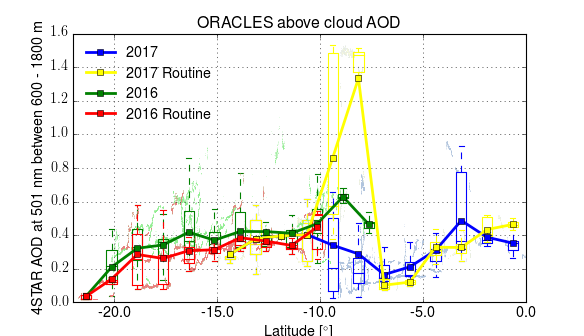

In [46]:
lima = np.linspace(-15,0,13)
posa = np.array([(l+lima[i+1])/2.0 for i,l in enumerate(lima[0:-1])])
plt.figure()
plt.plot(ar['Latitude'][ar['fl']],ar['AOD0501'][ar['fl']],'.',color='lightsteelblue',alpha=0.5,
         markersize=0.4)
plt.xlim([-22,0])
make_boxplot(ar['AOD0501'][ar['fl']],ar['Latitude'][ar['fl']],lima,posa,color='blue',label='2017',fliers_off=True)
plt.plot(ar['Latitude'][ar['flr']],ar['AOD0501'][ar['flr']],'.',color='lightyellow',alpha=0.5,
         markersize=0.4)
make_boxplot(ar['AOD0501'][ar['flr']],ar['Latitude'][ar['flr']],lima,posa,color='yellow',label='2017 Routine',
             fliers_off=True)


lim2a = np.linspace(-22,-7,13)
pos2a = np.array([(l+lim2a[i+1])/2.0 for i,l in enumerate(lim2a[0:-1])])
plt.plot(ar_1['Latitude'][ar_1['fl']],ar_1['AOD0501'][ar_1['fl']],'.',color='lightgreen',alpha=0.5,
         markersize=0.4)
make_boxplot(ar_1['AOD0501'][ar_1['fl']],ar_1['Latitude'][ar_1['fl']],lim2a,pos2a,color='green',
             label='2016',fliers_off=True)
plt.plot(ar_1['Latitude'][ar_1['flr']],ar_1['AOD0501'][ar_1['flr']],'.',color='lightcoral',alpha=0.5,
         markersize=0.4)
make_boxplot(ar_1['AOD0501'][ar_1['flr']],ar_1['Latitude'][ar_1['flr']],lim2a,pos2a,color='red',
             label='2016 Routine',fliers_off=True)

plt.xlabel('Latitude [$^\\circ$]')
plt.ylabel('4STAR AOD at 501 nm between 600 - 1800 m')
plt.grid()
plt.xlim([-22,0])
plt.legend(frameon=False,numpoints=1,loc=2)
#prelim()

plt.title('ORACLES above cloud AOD')
plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_latitude_2016_vs_2017_withroutine.png'.format(vv=vv),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


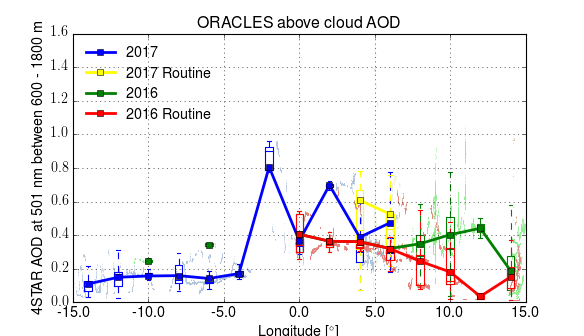

In [41]:
lima = np.linspace(-15,0,13)
posa = np.array([(l+lima[i+1])/2.0 for i,l in enumerate(lima[0:-1])])
plt.figure()
plt.plot(ar['Longitude'][ar['fl']],ar['AOD0501'][ar['fl']],'.',color='lightsteelblue',alpha=0.5,
         markersize=0.4)
plt.xlim([-15,15])
make_boxplot(ar['AOD0501'][ar['fl']],ar['Longitude'][ar['fl']],lim,pos,color='blue',label='2017',fliers_off=True)
plt.plot(ar['Longitude'][ar['flr']],ar['AOD0501'][ar['flr']],'.',color='lightyellow',alpha=0.5,
         markersize=0.4)
make_boxplot(ar['AOD0501'][ar['flr']],ar['Longitude'][ar['flr']],lim,pos,color='yellow',label='2017 Routine',
             fliers_off=True)


plt.plot(ar_1['Longitude'][ar_1['fl']],ar_1['AOD0501'][ar_1['fl']],'.',color='lightgreen',alpha=0.5,
         markersize=0.4)
make_boxplot(ar_1['AOD0501'][ar_1['fl']],ar_1['Longitude'][ar_1['fl']],lim2,pos2,color='green',
             label='2016',fliers_off=True)
plt.plot(ar_1['Longitude'][ar_1['flr']],ar_1['AOD0501'][ar_1['flr']],'.',color='lightcoral',alpha=0.5,
         markersize=0.4)
make_boxplot(ar_1['AOD0501'][ar_1['flr']],ar_1['Longitude'][ar_1['flr']],lim2,pos2,color='red',
             label='2016 Routine',fliers_off=True)

plt.xlabel('Longitude [$^\\circ$]')
plt.ylabel('4STAR AOD at 501 nm between 600 - 1800 m')
plt.grid()
plt.xlim([-15,15])
plt.legend(frameon=False,numpoints=1,loc=2)
#prelim()

plt.title('ORACLES above cloud AOD')
plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_longitude_2016_vs_2017_withroutine.png'.format(vv=vv),dpi=600,transparent=True)






if False:
    plt.figure()
    plt.plot(ar['Longitude'][ar['fl']],ar['AOD0501'][ar['fl']],'.',color='lightsteelblue',alpha=0.5,
             markersize=0.4,label='All 2017 data')
    plt.xlim([-15,15])
    make_boxplot(ar['AOD0501'][ar['fl']],ar['Longitude'][ar['fl']],lim,pos,color='blue',label='2017',fliers_off=True)
    plt.plot(ar_1['Longitude'][ar_1['fl']],ar_1['AOD0501'][ar_1['fl']],'.',color='lightcoral',alpha=0.5,
             markersize=0.4,label='All 2016 data')
    make_boxplot(ar_1['AOD0501'][ar_1['fl']],ar_1['Longitude'][ar_1['fl']],lim2,pos2,color='red',
                 label='20167 Statistics',fliers_off=True)

    plt.xlabel('Longitude [$^\\circ$]')
    plt.ylabel('4STAR AOD at 501 nm between 600 - 1800 m')
    plt.grid()
    plt.xlim([-15,15])
    plt.legend(frameon=False,numpoints=1,loc=2)
    prelim()

    plt.title('ORACLES above cloud AOD')
    plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_longitude_2016_vs_2017.png'.format(vv=vv),dpi=600,transparent=True)


<IPython.core.display.Javascript object>


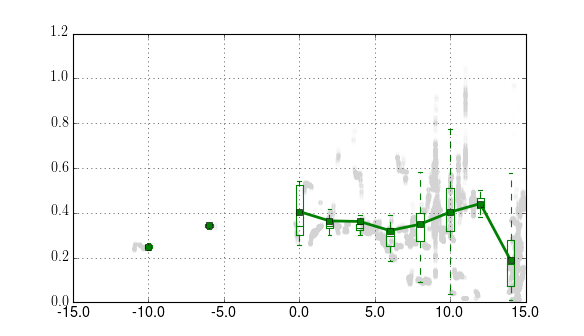

In [44]:
plt.figure()
plt.plot(ar_1['Longitude'][ar_1['fl']],ar_1['AOD0501'][ar_1['fl']],'.',color='lightgrey',alpha=0.01)
plt.xlim([-15.0,15.0])
make_boxplot(ar_1['AOD0501'][ar_1['fl']],ar_1['Longitude'][ar_1['fl']],lim2,pos2,color='green',
             label='2016',fliers_off=True)
plt.xlim([-15.0,15.0])
plt.xticks([-15,-10,-5,0,5,10,15])
plt.xlim([-15.0,15.0])
plt.grid()
#plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_AOD_longitude_2016_all.png'.format(vv=vv),dpi=600,transparent=True)

In [25]:
make_boxplot(ar_1['AOD0501'][ar_1['flr']],ar_1['Longitude'][ar_1['flr']],lim2,pos2,color='red',
             label='2016 Routine',fliers_off=True)

[nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.40563330125120306,
 0.36393878825733922,
 0.3613498723093761,
 0.32072785258681785,
 0.24506207121855603,
 0.18091590013140604,
 0.035463667820069197,
 0.15148435643564359]

In [31]:
ar_1['Longitude'][ar_1['flr']]

array([], dtype=float64)

# Plot aod spectra

In [50]:
len(ar['AOD0501'][ar['fl']]),len(ar['AOD0501'])

(24471, 397822)

In [56]:
fl = np.where(ar['fl'])[0]
fl_1 = np.where(ar_1['flr'])[0]

In [57]:
np.sort(ar.keys())

array([u'AOD0355', u'AOD0380', u'AOD0452', u'AOD0470', u'AOD0501',
       u'AOD0520', u'AOD0530', u'AOD0532', u'AOD0550', u'AOD0606',
       u'AOD0620', u'AOD0660', u'AOD0675', u'AOD0700', u'AOD0781',
       u'AOD0865', u'AOD1020', u'AOD1040', u'AOD1064', u'AOD1236',
       u'AOD1250', u'AOD1559', u'AOD1627', u'AOD1650', u'GPS_Alt',
       u'Latitude', u'Longitude', u'Start_UTC', u'UNCAOD0355',
       u'UNCAOD0380', u'UNCAOD0452', u'UNCAOD0470', u'UNCAOD0501',
       u'UNCAOD0520', u'UNCAOD0530', u'UNCAOD0532', u'UNCAOD0550',
       u'UNCAOD0606', u'UNCAOD0620', u'UNCAOD0660', u'UNCAOD0675',
       u'UNCAOD0700', u'UNCAOD0781', u'UNCAOD0865', u'UNCAOD1020',
       u'UNCAOD1040', u'UNCAOD1064', u'UNCAOD1236', u'UNCAOD1250',
       u'UNCAOD1559', u'UNCAOD1627', u'UNCAOD1650', u'amass_aer', u'days',
       u'fl', u'fl1', u'fl2', u'fl3', u'fl_QA', u'fl_alt', u'fl_alt_18',
       u'fl_alt_22', u'fl_alt_6', u'fl_routine', u'flr', u'qual_flag'],
      dtype='<U10')

In [92]:
aodsp = np.array([[ar['AOD0355'][i],ar['AOD0380'][i],ar['AOD0452'][i],ar['AOD0470'][i],ar['AOD0501'][i],
                   ar['AOD0520'][i],ar['AOD0530'][i],ar['AOD0532'][i],ar['AOD0550'][i],ar['AOD0606'][i],ar['AOD0620'][i],ar['AOD0660'][i],ar['AOD0675'][i],ar['AOD0700'][i],
                   ar['AOD0781'][i],ar['AOD0865'][i],ar['AOD1020'][i],ar['AOD1040'][i],ar['AOD1064'][i],ar['AOD1236'][i],ar['AOD1250'][i],ar['AOD1559'][i],ar['AOD1627'][i],
                   ar['AOD1650'][i]] for i in fl])

In [91]:
aodsp1 = np.array([[ar_1['AOD0355'][i],ar_1['AOD0380'][i],ar_1['AOD0452'][i],ar_1['AOD0470'][i],ar_1['AOD0501'][i],
                   ar_1['AOD0520'][i],ar_1['AOD0530'][i],ar_1['AOD0532'][i],ar_1['AOD0550'][i],ar_1['AOD0606'][i],ar_1['AOD0620'][i],ar_1['AOD0660'][i],ar_1['AOD0675'][i],ar_1['AOD0700'][i],
                   ar_1['AOD0781'][i],ar_1['AOD0865'][i],ar_1['AOD1020'][i],ar_1['AOD1040'][i],ar_1['AOD1064'][i],ar_1['AOD1236'][i],ar_1['AOD1250'][i],ar_1['AOD1559'][i],ar_1['AOD1627'][i],
                   ar_1['AOD1650'][i]] for i in fl_1])

In [62]:
aodsp.shape

(24471, 29)

In [63]:
bins = np.linspace(-22, 1, 50)
digitized = np.digitize(ar['Latitude'][fl], bins)

cc = plt.cm.gist_ncar(len(bins))

In [64]:
bins

array([-22.        , -21.53061224, -21.06122449, -20.59183673,
       -20.12244898, -19.65306122, -19.18367347, -18.71428571,
       -18.24489796, -17.7755102 , -17.30612245, -16.83673469,
       -16.36734694, -15.89795918, -15.42857143, -14.95918367,
       -14.48979592, -14.02040816, -13.55102041, -13.08163265,
       -12.6122449 , -12.14285714, -11.67346939, -11.20408163,
       -10.73469388, -10.26530612,  -9.79591837,  -9.32653061,
        -8.85714286,  -8.3877551 ,  -7.91836735,  -7.44897959,
        -6.97959184,  -6.51020408,  -6.04081633,  -5.57142857,
        -5.10204082,  -4.63265306,  -4.16326531,  -3.69387755,
        -3.2244898 ,  -2.75510204,  -2.28571429,  -1.81632653,
        -1.34693878,  -0.87755102,  -0.40816327,   0.06122449,
         0.53061224,   1.        ])

In [65]:
digitized

array([30, 30, 30, ..., 31, 31, 31])

In [68]:
cc = plt.cm.gist_ncar(bins)

In [69]:
cc.shape

(50, 4)

In [87]:
len(wv)

24

In [89]:
len(aodsp[j,:])

29

In [90]:
wv

[355.0,
 380.0,
 452.0,
 470.0,
 501.0,
 520.0,
 530.0,
 532.0,
 550.0,
 606.0,
 620.0,
 660.0,
 675.0,
 700.0,
 781.0,
 865.0,
 1020.0,
 1040.0,
 1064.0,
 1236.0,
 1250.0,
 1559.0,
 1627.0,
 1650.0]

<IPython.core.display.Javascript object>


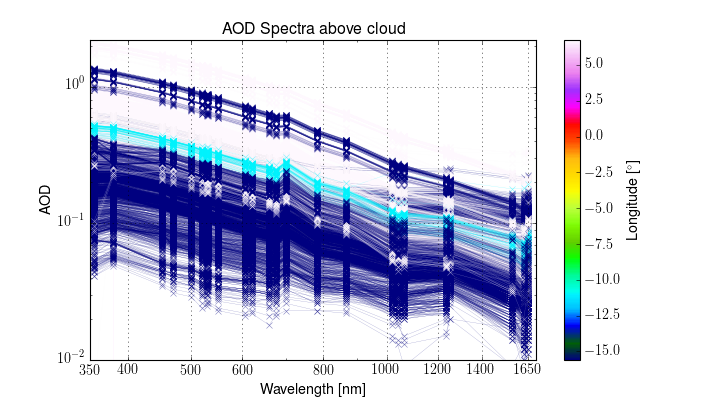

/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in greater
  del sys.path[0]


In [115]:
fig,ax = plt.subplots(1,sharex=True,figsize=(9,5))
#ax = ax.ravel()
ax.set_title('AOD Spectra above cloud')
axis = ar['days'][fl]
bins = np.linspace(-22, 10, 50)
digitized = np.digitize(ar['Longitude'][fl], bins)
cc = plt.cm.gist_ncar(bins)
cmapname = 'gist_ncar'

for j,f in enumerate(fl):
    if j%5>0: continue
    if not np.isfinite(aodsp[j,:]).any(): continue
    if any(aodsp[j,:]>0.0):
        ax.plot(wv,aodsp[j,:],'x-',c=cc[digitized[j],:],lw=0.2,alpha=0.5)
ax.set_ylim(0.01,2.2)
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylabel('AOD')
ax.set_ylim(0.01,2.2)
ax.set_xlabel('Wavelength [nm]')
ax.set_xlim(380.0,1700.0)
plt.xticks([350,400,500,600,800,1000,1200,1400,1650])

ax.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
ax.grid()

scalarmap = plt.cm.ScalarMappable(cmap=plt.cm.get_cmap(cmapname))
scalarmap.set_array(axis)
cba = plt.colorbar(scalarmap)
cba.set_label('Longitude [$^\\circ$]')
#plt.savefig(fp+'aod_ict_2017/{vv}/{vv}_high_alt_AOD_spectra_{vi}_{}.png'.format(d,vv=vv,vi=vi),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


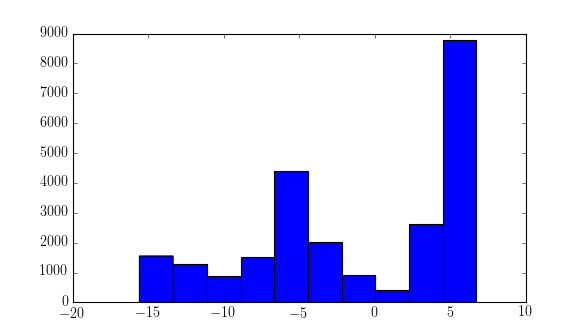

(array([ 1555.,  1285.,   897.,  1530.,  4410.,  2035.,   909.,   427.,
         2623.,  8800.]),
 array([-15.5973301 , -13.36387993, -11.13042976,  -8.89697959,
         -6.66352942,  -4.43007925,  -2.19662908,   0.03682109,
          2.27027126,   4.50372143,   6.7371716 ]),
 <a list of 10 Patch objects>)

In [112]:
plt.figure()
plt.hist(ar['Longitude'][fl])

In [99]:
cc[digitized[j],:]

array([ 0.   ,  0.   ,  0.502,  1.   ])

# Make histogram for each flight 

In [161]:
i

2

In [162]:
np.nanmean(outaod_RA[i]['AOD0501'][fl])

C:\Python27_64\WinPython-64bit-2.7.6.4\python-2.7.6.amd64\lib\site-packages\ipykernel_launcher.py:1: VisibleDeprecationWarning: boolean index did not match indexed array along dimension 0; dimension is 29715 but corresponding boolean dimension is 29539
  """Entry point for launching an IPython kernel.


1.3128954451345756

<IPython.core.display.Javascript object>


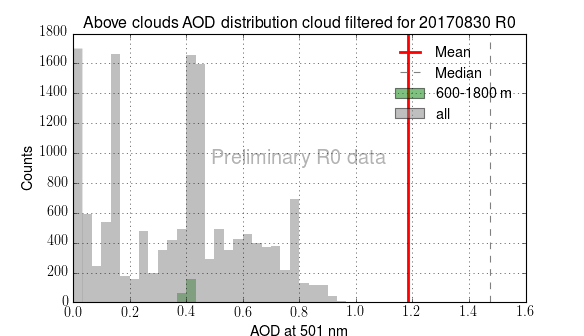

C:\Python27_64\WinPython-64bit-2.7.6.4\python-2.7.6.amd64\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in greater
  after removing the cwd from sys.path.
C:\Python27_64\WinPython-64bit-2.7.6.4\python-2.7.6.amd64\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in less
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>


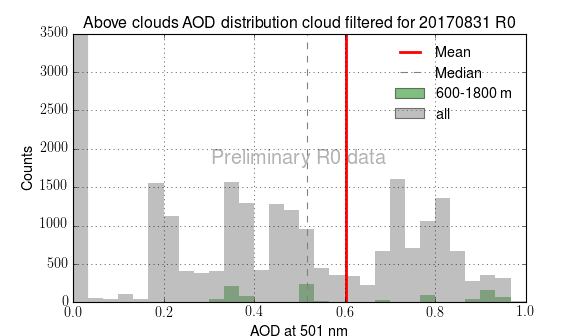

C:\Python27_64\WinPython-64bit-2.7.6.4\python-2.7.6.amd64\lib\site-packages\numpy\lib\function_base.py:229: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= mn)
C:\Python27_64\WinPython-64bit-2.7.6.4\python-2.7.6.amd64\lib\site-packages\numpy\lib\function_base.py:230: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= mx)


<IPython.core.display.Javascript object>


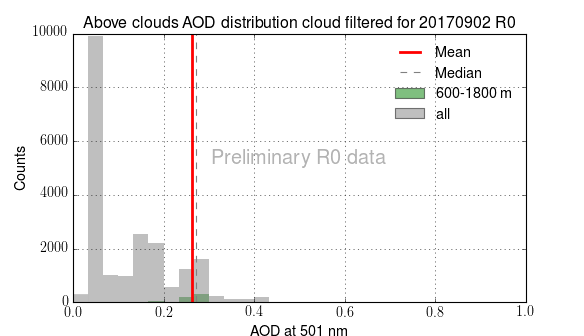

In [163]:
for i,d in enumerate(days):
    plt.figure()
    
    fl_alt = (outaod_RA[i]['GPS_Alt']>600) & (outaod_RA[i]['GPS_Alt']<1800)
    fl_QA = outaod_RA[i]['qual_flag']==0
    fl = fl_alt & fl_QA
    
    plt.hist(outaod_RA[i]['AOD0501'][fl],bins=30,range=(0,1.0),alpha=0.5,normed=False,
             edgecolor='None',color='g',label='600-1800 m')
    plt.hist(outaod_RA[i]['AOD0501'][fl_QA],bins=30,range=(0,1.0),alpha=0.5,normed=False,
             edgecolor='None',color='grey',label='all')
    plt.axvline(x=np.nanmean(outaod_RA[i]['AOD0501'][fl]),ls='-',color='r',lw=2.5,label='Mean')
    plt.axvline(x=np.nanmedian(outaod_RA[i]['AOD0501'][fl]),ls='--',color='grey',label='Median')
    plt.text(0.5, 0.5, 'Preliminary {} data'.format(vv),
        verticalalignment='bottom', horizontalalignment='center',
        transform=plt.gca().transAxes,
        color='k', fontsize=18,zorder=1,alpha=0.3)
    plt.xlabel('AOD at 501 nm')
    plt.ylabel('Counts')
    plt.grid()
    plt.title('Above clouds AOD distribution cloud filtered for {} {vv}'.format(d,vv=vv))
    plt.legend(frameon=False)
    plt.savefig(fp+'aod_ict_2017/{vv}/AOD_500_histogram_{}_{vv}.png'.format(d,vv=vv),dpi=600,transparent=True)

# Compare R0 and R1

In [63]:
ar1 = ar
ar0 = hs.loadmat(fp+'/aod_ict/all_aod_ict_R0.mat')

NameError: name 'hs' is not defined

In [64]:
ar1['fl_alt_6k'] = ar1['GPS_Alt'] > 5700.0
ar1['fl_up'] = ar1['fl_QA']&ar1['fl_alt_6k']

C:\Python27_64\WinPython-64bit-2.7.6.4\python-2.7.6.amd64\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


In [65]:
ar0['fl_alt_6k'] = ar0['GPS_Alt'] > 5700.0
ar0['fl_up'] = ar0['fl_QA']&ar0['fl_alt_6k']

NameError: name 'ar0' is not defined

In [66]:
ar0.keys()

NameError: name 'ar0' is not defined

<IPython.core.display.Javascript object>


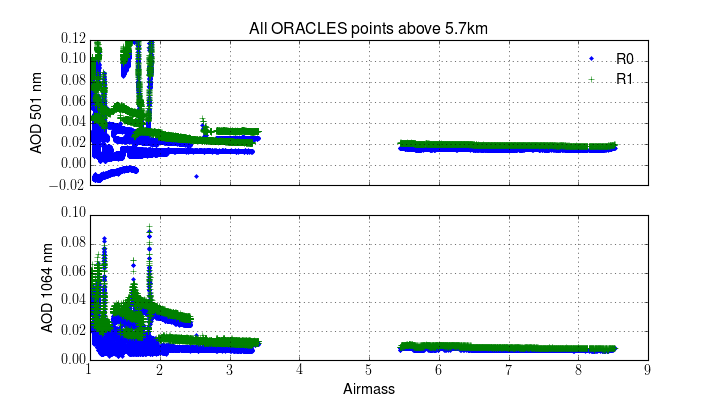

In [104]:
fig,ax = plt.subplots(2,sharex=True,figsize=(9,5))
ax = ax.ravel()
ax[0].plot(ar0['amass_aer'][ar0['fl_up']],ar0['AOD0501'][ar0['fl_up']],'.',label='R0')
ax[0].plot(ar1['amass_aer'][ar1['fl_up']],ar1['AOD0501'][ar1['fl_up']],'+',label='R1')
ax[0].set_ylabel('AOD 501 nm')
ax[0].set_ylim(-0.02,0.12)
ax[0].set_title('All ORACLES points above 5.7km')
ax[0].legend(frameon=False,numpoints=1)
ax[0].grid()

ax[1].plot(ar0['amass_aer'][ar0['fl_up']],ar0['AOD1064'][ar0['fl_up']],'.',label='R0')
ax[1].plot(ar1['amass_aer'][ar1['fl_up']],ar1['AOD1064'][ar1['fl_up']],'+',label='R1')
ax[1].set_xlabel('Airmass')
ax[1].set_ylabel('AOD 1064 nm')
ax[1].grid()

plt.savefig(fp+'aod_ict/{vv}/AOD_airmass_R0_vs_R1.png'.format(vv=vv),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


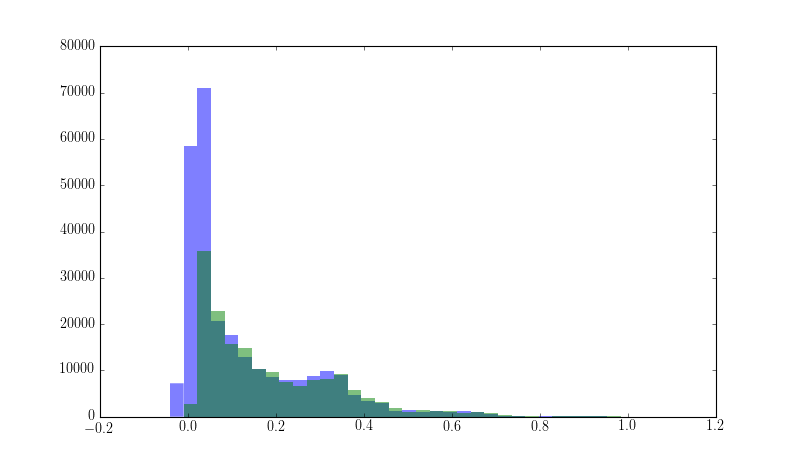

(array([  0.00000000e+00,   2.74800000e+03,   3.57460000e+04,
          2.27240000e+04,   1.57580000e+04,   1.47450000e+04,
          1.02030000e+04,   9.74100000e+03,   7.59900000e+03,
          6.52400000e+03,   8.01100000e+03,   8.22000000e+03,
          9.24000000e+03,   5.78400000e+03,   3.98900000e+03,
          3.18600000e+03,   1.97700000e+03,   1.04900000e+03,
          1.41800000e+03,   1.21900000e+03,   1.14100000e+03,
          8.12000000e+02,   1.11400000e+03,   7.41000000e+02,
          4.42000000e+02,   1.68000000e+02,   8.50000000e+01,
          3.30000000e+01,   7.00000000e+01,   7.10000000e+01,
          7.00000000e+01,   8.80000000e+01,   5.00000000e+01,
          1.10000000e+01,   3.00000000e+00,   7.00000000e+00,
          0.00000000e+00,   1.00000000e+00,   0.00000000e+00,
          0.00000000e+00]),
 array([-0.04 , -0.009,  0.022,  0.053,  0.084,  0.115,  0.146,  0.177,
         0.208,  0.239,  0.27 ,  0.301,  0.332,  0.363,  0.394,  0.425,
         0.456,  0.487

In [91]:
plt.figure()
plt.hist(ar0['AOD0501'][ar0['fl_QA']],bins=40,label='R0',range=(-0.04,1.2),alpha=0.5,edgecolor='None')
plt.hist(ar1['AOD0501'][ar1['fl_QA']],bins=40,label='R1',range=(-0.04,1.2),alpha=0.5,edgecolor='None')
plt.ylabel('AOd 501 nm')

# make plots of the gases

In [ ]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(2,sharex=True,figsize=(9,5))
    ax = ax.ravel()
    ax[0].set_title('Gas RA saved file for flight {}'.format(d))
    ax[0].set_color_cycle([plt.cm.gist_ncar(k) for k in np.linspace(0, 1, len(wl))])
    for aod in wl:
        ax[0].plot(outgas_RA[i][nm[0]],outgas_RA[i][aod],'.',label=aod)
    try:
        for x in outgas_RA[i][nm[0]][np.where(outgas_RA[i][nm[4]]==1)[0]]:
            ax[0].axvline(x,color='#DDDDDD',alpha=0.02)
    except:
        pass
    ax[0].set_ylabel('AOD')
    ax[0].set_ylim(0,3)
    ax[0].axhline(0,color='k')
    box = ax[0].get_position()
    ax[0].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[0].legend(frameon=False,loc='center left',bbox_to_anchor=(1.1,-0.2),numpoints=1)
    ax[1].plot(outaod_RA[i][nm[0]],outaod_RA[i]['GPS_Alt'],'.')
    ax[1].set_ylabel('Alt [m]')
    axy = ax[1].twinx()
    axy.plot(outaod_RA[i][nm[0]],outaod_RA[i]['amass_aer'],'.g')
    axy.set_ylabel('Airmass factor',color='g')
    box = ax[1].get_position()
    ax[1].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    box = axy.get_position()
    axy.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax[1].set_xlabel('UTC [h]')
    plt.savefig(fp+'aod_ict/RA_{}.png'.format(d),dpi=600,transparent=True)

In [32]:
outgas_RA[0].dtype.names

('Start_UTC',
 'Latitude',
 'Longitude',
 'GPS_Alt',
 'amass_O3',
 'amass_NO2',
 'CWV',
 'std_CWV',
 'QA_CWV',
 'VCD_O3',
 'resid_O3',
 'QA_O3',
 'VCD_NO2',
 'resid_NO2',
 'QA_NO2',
 'qual_flag')

<IPython.core.display.Javascript object>


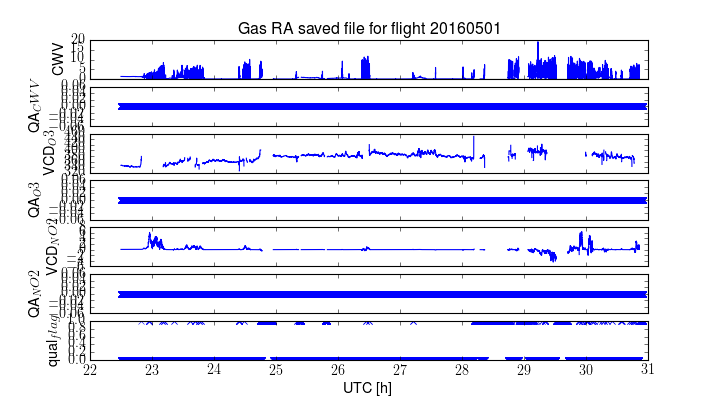

<IPython.core.display.Javascript object>


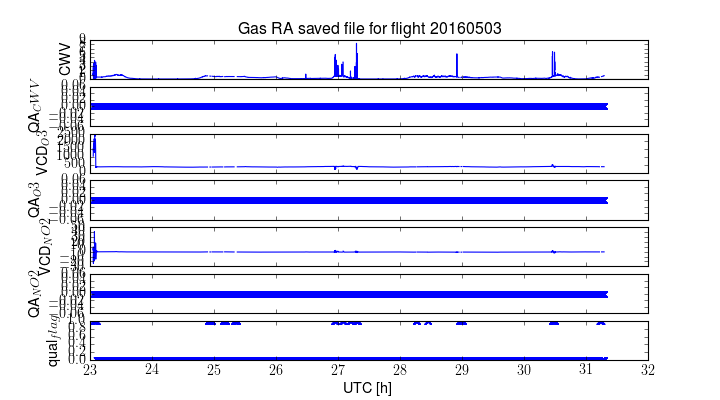

<IPython.core.display.Javascript object>


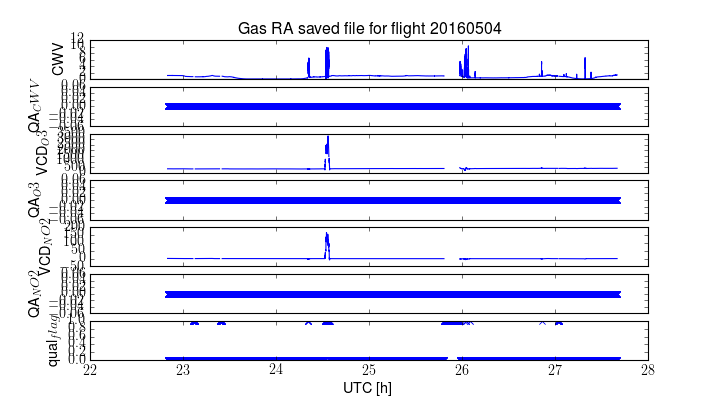

<IPython.core.display.Javascript object>


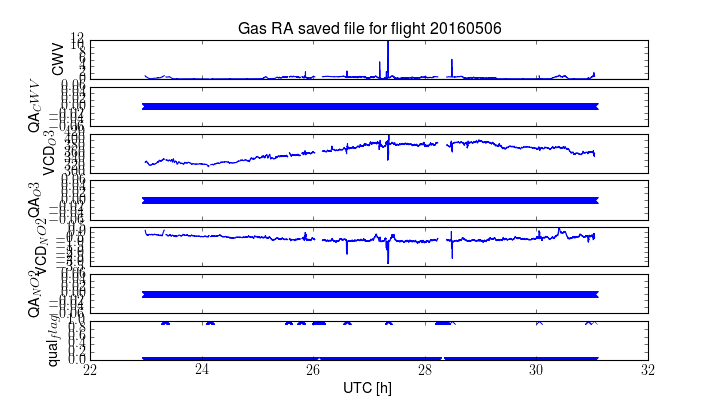

In [36]:
for i,d in enumerate(days):
    fig,ax = plt.subplots(7,sharex=True,figsize=(9,5))
    ax = ax.ravel()
    ax[0].set_title('Gas RA saved file for flight {}'.format(d))
    
    ax[0].plot(outgas_RA[i]['Start_UTC'],outgas_RA[i]['CWV'])
    ax[0].set_ylabel('CWV')
    #ax[0].set_ylim(0,3)
    ax[0].axhline(0,color='k')
    #box = ax[0].get_position()
    #ax[0].set_position([box.x0, box.y0, box.width * 0.8, box.height])
    #ax[0].legend(frameon=False,loc='center left',bbox_to_anchor=(1.1,-0.2),numpoints=1)
    ax[1].plot(outgas_RA[i]['Start_UTC'],outgas_RA[i]['QA_CWV'],'x')
    ax[1].set_ylabel('QA_CWV')
    
    ax[2].plot(outgas_RA[i]['Start_UTC'],outgas_RA[i]['VCD_O3'])
    ax[2].set_ylabel('VCD_O3')
    
    ax[3].plot(outgas_RA[i]['Start_UTC'],outgas_RA[i]['QA_O3'],'x')
    ax[3].set_ylabel('QA_O3')
    
    ax[4].plot(outgas_RA[i]['Start_UTC'],outgas_RA[i]['VCD_NO2'])
    ax[4].set_ylabel('VCD_NO2')
    
    ax[5].plot(outgas_RA[i]['Start_UTC'],outgas_RA[i]['QA_NO2'],'x')
    ax[5].set_ylabel('QA_NO2')
    
    ax[6].plot(outgas_RA[i]['Start_UTC'],outgas_RA[i]['qual_flag'],'x')
    ax[6].set_ylabel('qual_flag')
    
    ax[6].set_xlabel('UTC [h]')